# Imports

In [108]:
#!/usr/bin/env python

from __future__ import print_function

import platform
import sys
import os

import warnings
warnings.simplefilter(action='ignore')

import logging
#print all logging.INFO details
#logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.INFO)
#Supress default INFO logging
logger = logging.getLogger()
logger.setLevel(logging.CRITICAL)

from time import time
from itertools import groupby
from  more_itertools import unique_everseen
from operator import itemgetter

import bs4
from bs4 import BeautifulSoup
import urllib
from urllib.request import urlopen

import re
import regex
import string
import textwrap
from textwrap import fill

#import pycontractions
#from pycontractions import Contractions
import autocorrect
from autocorrect import spell

import numpy as np
import pandas as pd

import textacy
from textacy.preprocess import remove_punct

import spacy
from spacy.tokenizer import Tokenizer

import gensim
from gensim.matutils import hellinger
from gensim import corpora, models, similarities
from gensim.corpora import Dictionary
from gensim.models import Doc2Vec, CoherenceModel, LdaModel, HdpModel, LsiModel
from gensim.models.wrappers import LdaMallet #,LdaVowpalWabbit

import lda

import pyLDAvis.gensim
pyLDAvis.enable_notebook()

import IPython
from IPython.display import display

import sklearn
from sklearn import metrics
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer, TfidfTransformer
from sklearn.preprocessing import normalize
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA, NMF, TruncatedSVD #,LatentDirichletAllocation
from sklearn.manifold import TSNE

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
%matplotlib inline

import plotly
from plotly import tools
import plotly.plotly as py
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly.offline import download_plotlyjs,init_notebook_mode,plot,iplot
#connects JS to notebook so plots work inline
init_notebook_mode(connected=True)

import cufflinks as cf
#allow offline use of cufflinks
cf.go_offline()

import bokeh
from bokeh.io import push_notebook, show, output_notebook
import bokeh.plotting as bp
from bokeh.plotting import figure, save
from bokeh.models import ColumnDataSource, LabelSet, HoverTool
output_notebook()

Loading BokehJS ...

# Environment and Library Information

In [3]:
#environment and package versions
print('\n')
print("_"*70)
print('The environment and package versions used in this script are:')
print('\n')

print(platform.platform())
print('Python', sys.version)
print('OS', os.name)
print('Beautiful Soup', bs4.__version__)
print('Urllib', urllib.request.__version__) 
print('Regex', re.__version__)
print('Numpy', np.__version__)
print('Pandas', pd.__version__)
print('Textacy', textacy.__version__)
print('SpaCy', spacy.__version__)
print('Gensim', gensim.__version__)
print('LDA', lda.__version__)
print('PyLDAvis', pyLDAvis.__version__)
print('IPython', IPython.__version__)
print('Sklearn', sklearn.__version__)
print('Matplotlib', matplotlib.__version__)
print('Plotly', plotly.__version__)
print('Cufflinks', cf.__version__)
print('Bokeh', bokeh.__version__)

print('\n')
print("~"*70)
print('\n')



______________________________________________________________________
The environment and package versions used in this script are:


Windows-10-10.0.17134-SP0
Python 3.6.6 |Anaconda custom (64-bit)| (default, Jun 28 2018, 11:27:44) [MSC v.1900 64 bit (AMD64)]
OS nt
Beautiful Soup 4.6.0
Urllib 3.6
Regex 2.2.1
Numpy 1.15.4
Pandas 0.22.0
Textacy 0.6.2
SpaCy 2.0.12
Gensim 3.6.0
LDA 1.1.0
PyLDAvis 2.1.2
IPython 5.1.0
Sklearn 0.19.1
Matplotlib 2.2.2
Plotly 2.2.2
Cufflinks 0.12.1
Bokeh 0.12.4


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~




# Helper Functions

In [4]:
def get_movie_reviews(soup_broth, n_reviews_per_movie=1):
    
    print('Retrieving all baseline URLs... \n')

    base_urls = [ ("https://www.imdb.com" + tag.attrs['href'], tag.text.replace('\n',' ') ) 
                            for tag in soup_broth.findAll('a', attrs={'href': re.compile("^/title/.*_tt")}) ]
    
    print('Retrieved all second-level URLs... \n')

    level_2_urls = []
    for url, title in base_urls:
        soup = BeautifulSoup(urlopen(url).read(), 'html.parser')
        update_url = [("https://www.imdb.com" + tag.attrs['href']) 
                            for tag in soup.findAll('a', attrs={'href': re.compile("^/title/.*tt_urv")})]
        level_2_urls.append((update_url[0], title))
        
    print('Retrieved all third-level URLs... \n')

    level_3_urls = []
    for url, title in level_2_urls:
        soup = BeautifulSoup(urlopen(url).read(), 'html.parser')
        update_url = [("https://www.imdb.com" + tag.attrs['href'])
                          for tag in soup.findAll('a', attrs={'href': re.compile("^/review/.*tt_urv")})[:(n_reviews_per_movie*2)]]
        update_url = list(unique_everseen(update_url))
        for i in update_url:
            level_3_urls.append((i, title))
        
    print('Retrieved all fourth-level URLs... \n')

    level_4_urls = []
    for url, title in level_3_urls:
        soup = BeautifulSoup(urlopen(url).read(), 'html.parser')
        update_url = [("https://www.imdb.com" + soup.find('a', href=re.compile("^/review/.*rw_urv"))['href'])]
        level_4_urls.append((update_url[0], title))
        
    print('Retrieved all fifth-level URLs... \n')

    level_5_text = []
    for url, title in level_4_urls:
        soup = BeautifulSoup(urlopen(url).read(), 'html.parser')
        review_text = [(soup.find('div', {'class' : re.compile("^text")}).text)]
        level_5_text.append((review_text[0], title))
        
    print('All reviews retrieved! \n')

    return level_5_text

In [5]:
def clean_component(review, stop_words, tokenizer, puncts):
    """Text Cleaner: Tokenize, Remove Stopwords, Punctuation, Lemmatize, Spell Correct, Lowercase"""
    
    #rev_contract_exp = list(contract_model.expand_texts([review], precise=True))
    
    doc_tok = tokenizer(review)

    doc_lems = [tok.lemma_ for tok in doc_tok 
                    if (tok.text not in stop_words
                        and tok.text not in puncts
                        and tok.pos_ != "PUNCT" and tok.pos_ != "SYM")]
    
    lem_list = [re.search(r'\(?([0-9A-Za-z-]+)\)?', tok).group(1) 
                    if '-' in tok 
                    else spell(remove_punct(tok)) 
                        for tok in doc_lems]

    doc2vec_input = [t.lower() for tok in lem_list 
                         for t in tok.split() 
                             if t.lower() not in stop_words]
    
    return doc2vec_input

In [6]:
def get_tagged_documents(input_review_texts, stop_words, tokenizer, puncts, sentence_labeler):
    print('Creating Tagged Documents... \n')
    
    all_content = []
    j=0
    for rev, ttl in input_review_texts:
        print('Cleaning review #{}'.format(j+1))
        clean_rev = clean_component(rev, stop_words, tokenizer, puncts)
        all_content.append(sentence_labeler(clean_rev, [ttl]))
        j += 1

    print('Total Number of Movie Review Document Vectors: ', j)
    
    return all_content

In [39]:
def compute_coherence_values(model_type, dictionary, texts, max_topics, 
                                 corpus=False, topics=False, transformed_vectorizer=False, tfidf_norm=False,
                                 min_topics=2, stride=3, n_top_words=False, measure='u_mass',
                                 lsi_flag=False, nmf_flag=False, mallet_flag=False, mallet_path=False):

    coherence_values = []
    model_list = []
    if nmf_flag:
        feat_names = transformed_vectorizer.get_feature_names()
    
    for num_topics in range(min_topics, max_topics, stride):
        if lsi_flag:
            model=model_type(corpus=corpus, id2word=dictionary, num_topics=num_topics)
        elif nmf_flag:
            model=model_type(n_components=num_topics, init='nndsvd', random_state=111)
        elif mallet_flag:
            model=model_type(mallet_path=mallet_path, corpus=corpus, id2word=dictionary, num_topics=num_topics) 
        else:
            model=model_type(corpus=corpus, id2word=dictionary, num_topics=num_topics, random_state=121)   
            
        model_list.append(model)
        
        if nmf_flag:
            words_list = []
            
            for i in range(num_topics):
                model.fit(tfidf_norm)
                
                #for each topic, obtain the largest values, and add the words they map to into the dictionary
                words_ids = model.components_[i].argsort()[:-n_top_words - 1:-1]
                words = [feat_names[key] for key in words_ids]
                words_list.append(words)
                
            coherencemodel = CoherenceModel(topics=words_list, texts=texts, dictionary=dictionary, coherence=measure)
            
        else:
            coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence=measure)
        
        coherence_values.append(coherencemodel.get_coherence())
        print('Coherence of model with {} topics has been computed'.format(num_topics))
        
    print('All coherence values have been computed for the {} using the {} measure'.format(model_type, measure.upper()))
    print('\n')

    return model_list, coherence_values

In [8]:
def show_best_num_topics(model_type, umass_coherence_vals, cv_coherence_vals, max_topics, min_topics=2, stride=3):
    
    min_topics=min_topics
    max_topics=max_topics
    stride=stride
    
    x = range(min_topics, max_topics, stride)
    
    max_y1 = max(umass_coherence_vals)
    max_x1 = x[umass_coherence_vals.index(max_y1)]
    
    max_y2 = max(cv_coherence_vals)
    max_x2 = x[cv_coherence_vals.index(max_y2)] 
    
    fig = plt.figure(constrained_layout=True, figsize=(14,5))

    gs = GridSpec(1, 2, figure=fig)
    ax1 = fig.add_subplot(gs[0, 0])
    ax2 = fig.add_subplot(gs[0, -1])

    ax1.plot(x, umass_coherence_vals, label='Coherence Values')
    ax1.set_xlabel('Num Topics')
    ax1.set_ylabel('Coherence score (U_MASS)')
    ax1.legend(loc='best')
    ax1.text(max_x1, max_y1, str((max_x1, max_y1)))

    ax2.plot(x, cv_coherence_vals, label='Coherence Values')
    ax2.set_xlabel('Num Topics')
    ax2.set_ylabel('Coherence score (C_V)')
    ax2.legend(loc='best')
    ax2.text(max_x2, max_y2, str((max_x2, max_y2)))

    fig.suptitle('Coherence Scores ({})'.format(model_type))

    plt.show()

    print('The most coherent number of {} topics using the U_MASS measure is: {}'.format(model_type, max_x1))
    print('The most coherent number of {} topics using the C_V measure is: {}'.format(model_type, max_x2))
    print('\n')
    
    tup_list = [(max_x1, max_y1), (max_x2, max_y2)]
    best_num_topics = max(tup_list, key=itemgetter(1))[0]
    
    return best_num_topics

In [9]:
def get_topics(model, num_topics):
    
    word_dict = {}
    for i in range(num_topics):
        words = model.show_topic(i, topn = 20)
        word_dict['Topic # ' + '{:02d}'.format(i+1)] = [i[0] for i in words]
        
    return pd.DataFrame(word_dict)

In [10]:
def get_nmf_topics(model, num_topics, n_top_words):
    
    #the word ids obtained need to be reverse-mapped to the words so we can print the topic names.
    feat_names = vectorizer.get_feature_names()
    
    word_dict = {}
    for i in range(num_topics):
        
        #for each topic, obtain the largest values, and add the words they map to into the dictionary.
        words_ids = model.components_[i].argsort()[:-n_top_words - 1:-1]
        words = [feat_names[key] for key in words_ids]
        word_dict['Topic # ' + '{:02d}'.format(i+1)] = words
    
    return pd.DataFrame(word_dict)

In [11]:
def topics_2_bow(topic, model, lsi_flag=False, mallet_flag=False):

    topic = topic.split('+')
    topic_bow = []
    
    lsi_mallet_array = np.array([])
    lsi_mallet_dict = {}
    lsi_mallet_dict_scaled = {}
    
    for word in topic:
        #split probability and word
        try:
            prob, word = word.split('*')
        except:
            continue

        #replace unwanted characters
        rep = {' ': '', '"': ''}
        replace = dict((re.escape(k), v) for k, v in rep.items())
        pattern = re.compile("|".join(replace.keys()))
        word = pattern.sub(lambda m: replace[re.escape(m.group(0))], word)

        #convert to word_type
        try:
            word = model.id2word.doc2bow([word])[0][0]
        except:
            continue
            
        if lsi_flag or mallet_flag:
            lsi_mallet_array = np.append(lsi_mallet_array, float(prob))
            lsi_mallet_dict.update({word:prob})
              
        else:
            topic_bow.append((word, float(prob)))
                        
    if lsi_flag or mallet_flag:
        scaler = MinMaxScaler(feature_range=(0,1), copy=True)
        lsi_mallet_scaled = scaler.fit_transform(lsi_mallet_array.reshape(-1,1))
        
        lsi_mallet_scaled = (lsi_mallet_scaled - lsi_mallet_scaled.min()) / (lsi_mallet_scaled - lsi_mallet_scaled.min()).sum()
        
        for k,v in zip(lsi_mallet_dict.keys(), lsi_mallet_scaled):
            lsi_mallet_dict_scaled.update({k:v[0]})        

        for k,v in lsi_mallet_dict_scaled.items():
            topic_bow.append((k,v))
        
    return topic_bow

In [12]:
def get_most_similar_topics(model, topics_df=False, num_topics=False, mallet_flag=False, hdp_flag=False, lsi_flag=False, nmf_flag=False, columns=False):
    
    if not nmf_flag:
    
        mod_topics = tuple(topics_df.columns)
        mod_top_dict = {}

        if hdp_flag:
            for k,v in zip(mod_topics, model.show_topics(num_words=len(model.id2word))):
                mod_top_dict.update({k:v})
        else:    
            for k,v in zip(mod_topics, model.show_topics(num_words=len(model.id2word), num_topics=num_topics)):
                mod_top_dict.update({k:v})

        for k,v in mod_top_dict.items():
            mod_top_dict[k] = topics_2_bow(v[1], model, lsi_flag, mallet_flag)
    
    else:
        mod_topics = tuple(columns)
        mod_top_dict = {}
        
        nmf_top_list = []
        for k,v in zip(mod_topics, model.components_):
            nmf_top_list.append(tuple((k, v)))
        
        scaler = MinMaxScaler(feature_range=(0,1), copy=True)
        
        for k,v in nmf_top_list:
            v_scaled = scaler.fit_transform(v.reshape(-1,1))
            v = (v_scaled - v_scaled.min()) / (v_scaled - v_scaled.min()).sum()
            mod_top_dict.update({k:v})

    hellinger_dists = [(hellinger(mod_top_dict[x], mod_top_dict[y]), x, y)
                          for i,x in enumerate(mod_top_dict.keys())
                          for j,y in enumerate(mod_top_dict.keys())
                          if i != j]       

    unique_hellinger = [tuple(x) for x in set(map(frozenset, hellinger_dists)) if len(tuple(x)) == 3]
    
    resorted_hellinger = []
    for i in range(len(unique_hellinger)):
        resorted_hellinger.append(sorted(tuple(str(e) for e in unique_hellinger[i])))
        resorted_hellinger[i][0] = float(resorted_hellinger[i][0])
        resorted_hellinger[i] = tuple(resorted_hellinger[i])

    resorted_hellinger = sorted(resorted_hellinger, reverse=True)

    return resorted_hellinger

In [13]:
def get_dominant_topics(model, corpus, texts, lsi_flag=False):

    dom_topics_df = pd.DataFrame()

    #for all topic/topic-probability pairings
    for i, row in enumerate(model[corpus]):
        #return the pairings, sorting first the one with the highest topic-probability in the mixture
        if lsi_flag:
            row = sorted(row, key=lambda x: abs(x[1]), reverse=True)
        else:
            row = sorted(row, key=lambda x: (x[1]), reverse=True)     
        #for every topic/topic-probability pairing in the sorted tuple list
        for j, (topic_num, topic_prob) in enumerate(row):
            #take the pairing with the highest topic-probability
            if j == 0:
                #return the tuple list of top 'n' word-probabilities associated with that topic
                wp = model.show_topic(topic_num, topn=20)
                #create a list of those top 'n' words
                topic_keywords = ", ".join([word for word, prob in wp])
                #append to the empty dataframe a series containing:
                #    the dominant topic allocation for that document,
                #    the topic-probability it contributes to that document,
                #    and the top 'n' words associated with that topic
                dom_topics_df = dom_topics_df.append(pd.Series([int(topic_num), round(topic_prob,4), topic_keywords]), ignore_index=True)
            else:
                #ignore other topics in the mixture
                break
                
    #name the columns of the constructed dataframe
    dom_topics_df.columns = ['Dominant_Topic', 'Probability_Contribution', 'Topic_Keywords']

    #append to the original text as another column in the dataframe
    contents = pd.Series(texts)
    dom_topics_df = pd.concat([dom_topics_df, contents], axis=1)
    
    dom_topics_final = dom_topics_df.reset_index()
    dom_topics_final.columns = ['Document_Number', 'Dominant_Topic', 'Probability_Contribution', 'Topic_Keywords', 'Original_Text']
    dom_topics_final.set_index('Document_Number', inplace=True)
    
    return dom_topics_df, dom_topics_final

In [14]:
def get_most_representative_docs(dom_topics_final_df, n_topics=20, lsi_flag=False):
    
    representative_docs = pd.DataFrame()
    
    dom_topics_grpd = dom_topics_final_df.groupby('Dominant_Topic')

    #for every dominant topic, find the document to which it contributed the greatest (or largest magnitude [LSI]) probability contribution
    if not lsi_flag:    
        for i, grp in dom_topics_grpd:
            representative_docs = pd.concat([representative_docs, 
                                                grp.sort_values(['Probability_Contribution'], ascending=True).head(1)], 
                                                axis=0)
    else:
        for i, grp in dom_topics_grpd:
            representative_docs = pd.concat([representative_docs,
                                                #sort by descending absolute value
                                                grp.reindex(grp.Probability_Contribution.abs().sort_values(inplace=False, ascending=False).index).head(1)],
                                                axis=0)

    representative_docs.reset_index(drop=True, inplace=True)

    representative_docs.columns = ['Topic_Number', 'Probability_Contribution', 'Topic_Keywords', 'Most_Representative_Document']
    representative_docs['Topic_Number'] = representative_docs['Topic_Number'].astype(int)

    representative_docs.set_index('Topic_Number', inplace=True)

    rep_docs_first_n = representative_docs.head(n_topics)
    
    return rep_docs_first_n

In [15]:
def get_topic_distribution(dom_topics_final_df, rep_doc_df=False, n_topics=20, hdp_flag=False):
    
    if hdp_flag:
        
        rep_doc_df = get_most_representative_docs(dom_topics_final_df, n_topics=dom_topics_final_df['Dominant_Topic'].nunique())
    
    rep_doc_df.reset_index(inplace=True)
    
    #topic number and keywords
    topic_num_keywords = rep_doc_df[['Topic_Number', 'Topic_Keywords']]
    
    #number of documents allocated to each topic
    topic_counts = dom_topics_final_df['Dominant_Topic'].value_counts()
    
    #topic allocation percentage of total corpus
    topic_percent = round(topic_counts/topic_counts.sum(), 4)
    
    #concat number of allocated docs and percentage
    topic_dist = pd.concat([topic_num_keywords, topic_counts, topic_percent], axis=1)
    
    topic_dist.columns = ['Topic_Number', 'Topic_Keywords', 'Documents_per_Topic', 'Percent_of_Total_Corpus']
    topic_dist.dropna(axis=0, how='any', inplace=True)
    
    topic_dist['Topic_Number'] = topic_dist['Topic_Number'].astype(int)
    topic_dist.set_index('Topic_Number', inplace=True)
    
    topic_dist = topic_dist[['Documents_per_Topic', 'Percent_of_Total_Corpus', 'Topic_Keywords']]

    topic_dist_first_n = topic_dist.head(n_topics)
    
    return topic_dist_first_n

In [16]:
def svd_2D_scatter(svd_2D_transformed, color_scale_dimension=0):
    
    trace = go.Scattergl(
    x = svd_2D_transformed[:,0],
    y = svd_2D_transformed[:,1],
    mode = 'markers',
    marker = dict(
        color = svd_2D_transformed[:,color_scale_dimension],
        colorscale='Viridis',
        colorbar=dict(title='TF-IDF Variation: SVD Component #{}'.format(color_scale_dimension+1)),
        line = dict(width = 1)
    ),
    text = vectorizer.get_feature_names(),
    )
    
    data = [trace]
    iplot(data, filename='scatter-mode')
    
    return None

In [17]:
def svd_3D_scatter(svd_3D_transformed, color_scale_dimension=0):
    
    svd_3D_dim_range = np.stack((np.amax(svd_3D_transformed, axis=0), np.amin(svd_3D_transformed, axis=0)))
    svd_3D_max_dim = max(np.max(svd_3D_dim_range, axis=0))
    svd_3D_max_dim += svd_3D_max_dim*(0.1)
    
    fig = tools.make_subplots(rows=1, cols=1,
                          print_grid=False,
                          specs=[[{'is_3d': True}]])
    scene = dict(
        camera = dict(
        up=dict(x=0, y=0, z=1),
        center=dict(x=0, y=0, z=0),
        eye=dict(x=2.5, y=0.1, z=0.1)
        ),

        xaxis=dict(
            range=[-svd_3D_max_dim, svd_3D_max_dim],
            title='SVD_C1',
            gridcolor='rgb(255, 255, 255)',
            zerolinecolor='rgb(255, 255, 255)',
            showbackground=True,
            backgroundcolor='rgb(230, 230,230)',
            showticklabels=False, ticks=''
        ),
        yaxis=dict(
            range=[-svd_3D_max_dim, svd_3D_max_dim],
            title='SVD_C2',
            gridcolor='rgb(255, 255, 255)',
            zerolinecolor='rgb(255, 255, 255)',
            showbackground=True,
            backgroundcolor='rgb(230, 230,230)',
            showticklabels=False, ticks=''
        ),
        zaxis=dict(
            range=[-svd_3D_max_dim, svd_3D_max_dim],
            title='SVD_C3',
            gridcolor='rgb(255, 255, 255)',
            zerolinecolor='rgb(255, 255, 255)',
            showbackground=True,
            backgroundcolor='rgb(230, 230,230)',
            showticklabels=False, ticks=''
        )
    )

    centers = [[1, 1], [-1, -1], [1, -1]]
    X = svd_3D_transformed

    trace = go.Scatter3d(x=X[:, 0], y=X[:, 1], z=X[:, 2],
                             showlegend=False,
                             mode='markers',

                             marker=dict(
                                color=X[:,color_scale_dimension],
                                colorscale='Viridis',
                                colorbar=dict(title='TF-IDF Variation: SVD Component #{}'.format(color_scale_dimension+1)),
                                line=dict(color='black', width=1)),

                            text = vectorizer.get_feature_names())

    fig.append_trace(trace, 1, 1)

    fig['layout'].update(height=1000, width=1200,
                         margin=dict(l=10,r=10))

    fig['layout']['scene'].update(scene)

    iplot(fig)
    
    return None

In [18]:
def plot_tsne(doc_list, fitted_lda, fitted_count_vectorizer, transformed_lda, transformed_tsne, color_map, n_top_words=10):
    
    n_top_words = n_top_words
    color_map = color_map
    
    #retrieve component key words
    _lda_keys = []
    for i in range(transformed_lda.shape[0]):
        _lda_keys +=  transformed_lda[i].argmax(),
        
    topic_summaries = []
    #matrix of shape n_topics x len(vocabulary)
    topic_words = fitted_lda.topic_word_
    #all vocab words (strings)
    vocab = fitted_count_vectorizer.get_feature_names()
    for i, topic_dist in enumerate(topic_words):
        #np.argsort returns indices that would sort an array
        #iterates over topic component vectors, sorts array in asc order, appends key words from end of array
        topic_word = np.array(vocab)[np.argsort(topic_dist)][:-(n_top_words + 1):-1]
        topic_summaries.append(' '.join(topic_word))
    
    num_example = len(transformed_lda)

    plot_dict = {
            'x': transformed_tsne[:, 0],
            'y': transformed_tsne[:, 1],
            'colors': color_map[_lda_keys][:num_example],
            'content': doc_list[:num_example],
            'topic_key': _lda_keys[:num_example]
            }

    #create dataframe from dictionary
    plot_df = pd.DataFrame.from_dict(plot_dict)

    source = bp.ColumnDataSource(data=plot_df)
    title = 'LDA T-SNE Visualization'

    plot_lda = bp.figure(plot_width=1400, plot_height=1100,
                         title=title,
                         tools="pan,wheel_zoom,box_zoom,reset,hover,previewsave",
                         x_axis_type=None, y_axis_type=None, min_border=1)

    plot_lda.scatter('x','y', color='colors', source=source)

    topic_coord = np.empty((transformed_lda.shape[1], 2)) * np.nan
    for topic_num in _lda_keys:
        if not np.isnan(topic_coord).any():
            break
        topic_coord[topic_num] = transformed_tsne[_lda_keys.index(topic_num)]

    #plot key words
    for i in range(transformed_lda.shape[1]):
        plot_lda.text(topic_coord[i, 0], topic_coord[i, 1], [topic_summaries[i]])

    #hover tools
    hover = plot_lda.select(dict(type=HoverTool))
    hover.tooltips = {"content": "@content - topic: @topic_key"}

    # save the plot
    #save(plot_lda, '{}.html'.format(title))

    #Cf. JSON Serialization issue: 
    #    https://github.com/bokeh/bokeh/issues/5439
    #    https://github.com/bokeh/bokeh/issues/6222
    #   https://github.com/bokeh/bokeh/issues/7523
    try:
        show(plot_lda, notebook_handle=True)
    except Exception as e:
        print('Note!: {}'.format(e.__doc__))
        print(e)

    return None

In [19]:
#dataframe styling
def color_green(val):
    color = 'green' if isinstance(val, float) else 'black'
    return 'color: {col}'.format(col=color)

def make_bold(val):
    weight = 700 if isinstance(val, float) else 400
    return 'font-weight: {wt}'.format(wt=weight)

In [20]:
def pretty_print(input_text):
    
    pieces = [str(word) for word in input_text]
    output = ' '.join(pieces)
    #write_up = fill(output)
    print('Hellinger Distances between topics are: \n')
    print('_'*70)
    print('\n')
    print(output.translate({ord(')'):')\n'}))
    print('_'*70)
    #print(write_up)
    
    return None

# Loading Language, Punctuation, and Tagged Document Models

In [21]:
nlp = spacy.load('en')

#cont = Contractions('../GoogleNews-vectors-negative300.bin.gz')
#cont.load_models()

punctuations = string.punctuation

LabeledSentence1 = gensim.models.doc2vec.TaggedDocument

# Loading Tokenizer and Updating Stop Words

In [22]:
tokenizer = Tokenizer(nlp.vocab)

#stopwords = spacy.lang.en.STOP_WORDS
#spacy.lang.en.STOP_WORDS.add("e.g.")
#nlp.vocab['the'].is_stop
nlp.Defaults.stop_words |= {"(a)", "(b)", "(c)", "etc", "etc.", "etc.)", "w/e", "(e.g.", "no?", "s", 
                           "film", "movie","0","1","2","3","4","5","6","7","8","9","10","e","f","k","n","q",
                            "de","oh","ones","miike","http","imdb", "horror", "like", "good", "great", "little", 
                            "come", "way", "know", "michael", "lot", "thing", "films", "later", "actually", "find", 
                            "big", "long", "away", "filmthe", "www", "com", "x", "aja", "agritos", "lon", "therebravo", 
                            "gou", "b", "particularly", "probably", "sure", "greenskeeper", "try", 
                            "half", "intothe", "especially", "exactly", "20", "ukr", "thatll", "darn", "certainly", "simply", }

stopwords = list(nlp.Defaults.stop_words)

# Retrieving and Cleaning Reviews of the Best Horror Movies

In [24]:
#open the base URL webpage
html_page = urlopen("https://www.imdb.com/list/ls059633855/")

#instantiate beautiful soup object of the html page
soup = BeautifulSoup(html_page, 'lxml')

review_text_first_5 = get_movie_reviews(soup, n_reviews_per_movie=5)

Retrieving all baseline URLs... 

Retrieved all second-level URLs... 

Retrieved all third-level URLs... 

Retrieved all fourth-level URLs... 

Retrieved all fifth-level URLs... 

All reviews retrieved! 



In [27]:
all_good_movie_reviews_500 = get_tagged_documents(review_text_first_5, stopwords, tokenizer, punctuations, LabeledSentence1)

Creating Tagged Documents... 

Cleaning review #1
Cleaning review #2
Cleaning review #3
Cleaning review #4
Cleaning review #5
Cleaning review #6
Cleaning review #7
Cleaning review #8
Cleaning review #9
Cleaning review #10
Cleaning review #11
Cleaning review #12
Cleaning review #13
Cleaning review #14
Cleaning review #15
Cleaning review #16
Cleaning review #17
Cleaning review #18
Cleaning review #19
Cleaning review #20
Cleaning review #21
Cleaning review #22
Cleaning review #23
Cleaning review #24
Cleaning review #25
Cleaning review #26
Cleaning review #27
Cleaning review #28
Cleaning review #29
Cleaning review #30
Cleaning review #31
Cleaning review #32
Cleaning review #33
Cleaning review #34
Cleaning review #35
Cleaning review #36
Cleaning review #37
Cleaning review #38
Cleaning review #39
Cleaning review #40
Cleaning review #41
Cleaning review #42
Cleaning review #43
Cleaning review #44
Cleaning review #45
Cleaning review #46
Cleaning review #47
Cleaning review #48
Cleaning review #4

# Retrieving and Cleaning Reviews of the Worst Horror Movies

In [28]:
#open the base URL webpage
html_page_bad = urlopen("https://www.imdb.com/list/ls059633855/")

#instantiate beautiful soup object of the html page
soup_bad = BeautifulSoup(html_page_bad, 'lxml')

review_text_first_5_bad = get_movie_reviews(soup_bad, n_reviews_per_movie=5)

Retrieving all baseline URLs... 

Retrieved all second-level URLs... 

Retrieved all third-level URLs... 

Retrieved all fourth-level URLs... 

Retrieved all fifth-level URLs... 

All reviews retrieved! 



In [29]:
all_bad_movie_reviews_500 = get_tagged_documents(review_text_first_5_bad, stopwords, tokenizer, punctuations, LabeledSentence1)

Creating Tagged Documents... 

Cleaning review #1
Cleaning review #2
Cleaning review #3
Cleaning review #4
Cleaning review #5
Cleaning review #6
Cleaning review #7
Cleaning review #8
Cleaning review #9
Cleaning review #10
Cleaning review #11
Cleaning review #12
Cleaning review #13
Cleaning review #14
Cleaning review #15
Cleaning review #16
Cleaning review #17
Cleaning review #18
Cleaning review #19
Cleaning review #20
Cleaning review #21
Cleaning review #22
Cleaning review #23
Cleaning review #24
Cleaning review #25
Cleaning review #26
Cleaning review #27
Cleaning review #28
Cleaning review #29
Cleaning review #30
Cleaning review #31
Cleaning review #32
Cleaning review #33
Cleaning review #34
Cleaning review #35
Cleaning review #36
Cleaning review #37
Cleaning review #38
Cleaning review #39
Cleaning review #40
Cleaning review #41
Cleaning review #42
Cleaning review #43
Cleaning review #44
Cleaning review #45
Cleaning review #46
Cleaning review #47
Cleaning review #48
Cleaning review #4

# Creating Corpus of Combined Reviews of Best and Worst Horror Movies

In [30]:
all_reviews = all_good_movie_reviews_500 + all_bad_movie_reviews_500

In [31]:
all_reviews_text = []
all_reviews_ttl = []
for i in range(len(all_reviews)):
    all_reviews_text.append(all_reviews[i][0])
    all_reviews_ttl.append(all_reviews[i][1][0])

In [32]:
reg_ex = regex.compile('[^a-zA-Z]')

In [33]:
dictionary = corpora.Dictionary(all_reviews_text)

In [34]:
#remove extremes (similar to the min/max df step used when creating the tf-idf matrix)
#filtered_dict = dictionary.filter_extremes(no_below=1, no_above=0.8)

#convert the dictionary to a bag of words corpus for reference
corpus = [dictionary.doc2bow(text) for text in all_reviews_text]

In [35]:
all_reviews_joined = [' '.join(w) for w in all_reviews_text]

# LDA (Latent Dirichlet Allocation)

## Cf. http://www.jmlr.org/papers/volume3/blei03a/blei03a.pdf
## Cf. https://nlp.stanford.edu/events/illvi2014/papers/sievert-illvi2014.pdf  (LDAvis)
## Cf. http://svn.aksw.org/papers/2015/WSDM_Topic_Evaluation/public.pdf (Topic Coherence Measures)

In [41]:
mod_list_lda_umass, coh_list_lda_umass = compute_coherence_values(LdaModel, dictionary, all_reviews_text, max_topics=20, 
                                                                     corpus=corpus, topics=False, transformed_vectorizer=False, tfidf_norm=False,
                                                                     min_topics=2, stride=3, n_top_words=False, measure='u_mass')

mod_list_lda_cv, coh_list_lda_cv = compute_coherence_values(LdaModel, dictionary, all_reviews_text, max_topics=20, 
                                                                     corpus=corpus, topics=False, transformed_vectorizer=False, tfidf_norm=False,
                                                                     min_topics=2, stride=3, n_top_words=False, measure='c_v')

Coherence of model with 2 topics has been computed
Coherence of model with 5 topics has been computed
Coherence of model with 8 topics has been computed
Coherence of model with 11 topics has been computed
Coherence of model with 14 topics has been computed
Coherence of model with 17 topics has been computed
All coherence values have been computed for the <class 'gensim.models.ldamodel.LdaModel'> using the U_MASS measure


Coherence of model with 2 topics has been computed
Coherence of model with 5 topics has been computed
Coherence of model with 8 topics has been computed
Coherence of model with 11 topics has been computed
Coherence of model with 14 topics has been computed
Coherence of model with 17 topics has been computed
All coherence values have been computed for the <class 'gensim.models.ldamodel.LdaModel'> using the C_V measure




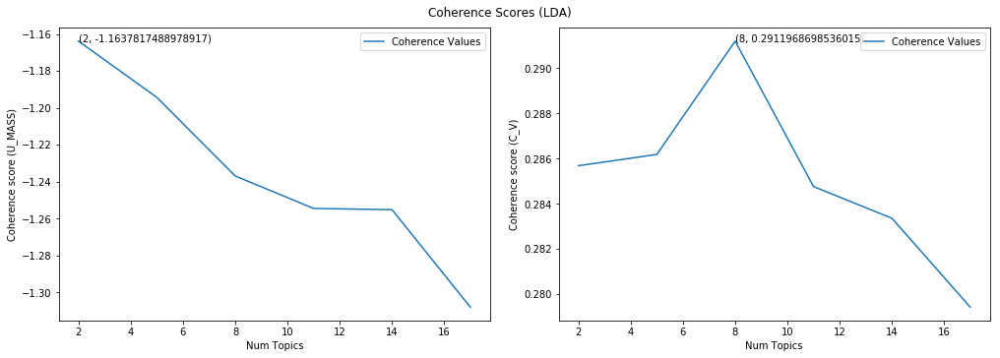

The most coherent number of LDA topics using the U_MASS measure is: 2
The most coherent number of LDA topics using the C_V measure is: 8


The most coherent number of LDA topics to use is: 8


In [42]:
best_num_lda_topics = show_best_num_topics('LDA', coh_list_lda_umass, coh_list_lda_cv, max_topics=20, min_topics=2, stride=3)
print('The most coherent number of LDA topics to use is: {}'.format(best_num_lda_topics))

In [43]:
lda_mod = models.LdaModel(corpus, num_topics=best_num_lda_topics,  
                                id2word=dictionary, 
                                update_every=0, #batch training
                                chunksize=1000, 
                                passes=500,
                                random_state=121)

In [44]:
#Perplexity measure (lower is better)
print('The Perplexity measure of the final LDA model is: {}'.format(lda_mod.log_perplexity(corpus)))

The Perplexity measure of the final LDA model is: -8.298304571058113


In [39]:
#topics_matrix = lda_mod.show_topics(formatted=True, num_words=20)
#topics_matrix = np.array(topics_matrix)
#topics_matrix.shape

In [40]:
#topic_words = topics_matrix[:,1]
#for i in topic_words:
#    print([reg_ex.sub('', w) for w in i.split() if len(reg_ex.sub('', w)) > 0])
#    print('\n')

In [45]:
lda_df = get_topics(lda_mod, best_num_lda_topics)
#print(lda_df)
lda_df

,Topic # 01,Topic # 02,Topic # 03,Topic # 04,Topic # 05,Topic # 06,Topic # 07,Topic # 08
0,watch,story,story,character,story,story,story,story
1,story,time,dont,story,watch,end,watch,character
2,think,scene,character,people,time,character,scene,time
3,time,think,time,time,think,time,time,feel
4,feel,character,act,work,original,plot,love,dont
5,character,end,work,dont,feel,start,people,scene
6,scare,feel,people,scene,people,scene,original,people
7,people,room,feel,love,scene,watch,ghost,think
8,family,leave,audience,place,play,fan,dont,look
9,leave,plot,watch,play,end,director,feel,watch


In [46]:
lda_hellinger_topic_distances = get_most_similar_topics(lda_mod, lda_df, num_topics=best_num_lda_topics)
pretty_print(lda_hellinger_topic_distances)

Hellinger Distances between topics are: 

______________________________________________________________________


(0.4837110411248617, 'Topic # 01', 'Topic # 06')
 (0.48174251539487667, 'Topic # 03', 'Topic # 06')
 (0.4748510044883907, 'Topic # 06', 'Topic # 07')
 (0.4717990853726296, 'Topic # 04', 'Topic # 06')
 (0.46271629711555196, 'Topic # 03', 'Topic # 07')
 (0.46173491768957614, 'Topic # 02', 'Topic # 03')
 (0.46127626256335685, 'Topic # 02', 'Topic # 06')
 (0.46001700327696304, 'Topic # 03', 'Topic # 04')
 (0.4575400998567088, 'Topic # 02', 'Topic # 07')
 (0.4549526255283364, 'Topic # 01', 'Topic # 04')
 (0.45447676874309, 'Topic # 02', 'Topic # 04')
 (0.4544377282672066, 'Topic # 01', 'Topic # 02')
 (0.4515640911141052, 'Topic # 06', 'Topic # 08')
 (0.45126237662510776, 'Topic # 04', 'Topic # 07')
 (0.44308567455525505, 'Topic # 04', 'Topic # 05')
 (0.4390830521079113, 'Topic # 01', 'Topic # 05')
 (0.4389738920982188, 'Topic # 01', 'Topic # 07')
 (0.4387911167272729, 'Topic # 

In [47]:
lda_mod_dom_topics_df, lda_mod_dom_topics_final = get_dominant_topics(lda_mod, corpus, all_reviews_joined)

In [48]:
#lda_mod_dom_topics_final.style.applymap(color_green).applymap(make_bold)
lda_mod_dom_topics_final_first30 = lda_mod_dom_topics_final.head(30)
lda_mod_dom_topics_final_first30.style.applymap(color_green).applymap(make_bold)

,Dominant_Topic,Probability_Contribution,Topic_Keywords,Original_Text
Document_Number,,,,
0,4,0.9921,"story, watch, time, think, original, feel, people, scene, play, end, plot, work, love, look, director, dont, new, girl, want, character",coherent plot tell non-straightforward fashion open interpretations leave require audience fill-in open end possibly filling-in require viewings considerable think sense watch wailing time impression kind watch ponder read watch attempt people interpret explain different conclusion coherent underlie plot matt shift piece puzzle attempt recreate coherent narrative piece fit incompetence underlie story possibly intentionally possibly fundamentally inconsistent optical illusion escher drawing appear describe physical object fact dont physical sense accordingly enjoy boil content technically well-made cinematography acting costumes plot sense tell deceptive lure think plot sense matt sufficient thought leave lingering irritate feel dissatisfaction confusion maybe precisely point tell story purpose instill audience feel confusion face sequence event sense life times
1,2,0.9883,"story, dont, character, time, act, work, people, feel, audience, watch, look, home, scene, genre, scary, end, love, director, scare, think",spoiler review extraordinary hour technically-perfect humanistic fine writer directors business hauteur saw devil cipher close analog suggest david lynches 2001 mulholland drive technically perfect humanistic suspense opus captivate length walk theatre shake head wonder saw film-makers understand secret story tell present story viewer feel share experience protagonist tell story viewer going provide explanation wailing means re-quote writer director numerous interview enigmatically begin wonder nature god -- recommended levels entertainment puzzled clinic engage wont let
2,6,0.9972,"story, watch, scene, time, love, people, original, ghost, dont, feel, doesnt, think, creepy, ive, character, remake, end, zombie, want, act",wailing open quote bible easy forget fact watch certain point clear purpose quote served warning religious person scare wailing work religious parables overcome lengthy run time tonal imbalanced deliver funny truly terrify mysterious strange small village south korean village plague sickness police think wild mushroom blame police officer jong-goo think stranger meet woman information mysterious man slowly begin fall rabbit hole consume life daughter start sign sickness personal figure trust avoid director hong-jin nap struggle tonal balance time pitch perfect time place tone struggle stay consistent primarily funny brief burst depravity violence comedy work laugh numb times horrific imagery sudden effective balance lose act comedy slapstick fit rest character over-the-top act exaggerate different introduced middle section moment unintentional humor example man strike lighten caller id shaman phone shaman fortunately balance act smartly switch act intense terrify moment comedy offset terrify act start unfold audience gain new appreciation rest start reinterpret certain scenes problem scene sense ended feel natural fit story progressed require end sense hour minutes middle portion resolved shaman screen time perform ritual end important zombie scene feel awkward didnt fit rest want zombie grow popularity scene bring numb random character serve purpose rest despite scene previously mention overacting act generally speak fantastic father task solve happen daughter convey terror hatred build intense persona carry priest train advice father equally effective bring concern innocent quality terror ultimately happen young daughter sick shines channeling inner linda blair emphatically deliver horrible dirty line child performance truly terrify watch hatred eye slowly end religious overtone clearer locusts attack individual white black suggest characters true nature scene truly shines slowly unveil real nature certain characters minute change perspective things minute switch dete

In [49]:
lda_most_representative_docs = get_most_representative_docs(lda_mod_dom_topics_final, n_topics=20)
lda_most_representative_docs.style.applymap(color_green).applymap(make_bold)

,Probability_Contribution,Topic_Keywords,Most_Representative_Document
Topic_Number,,,
0,0.3801,"watch, story, think, time, feel, character, scare, people, family, leave, end, look, ive, want, work, sarah, act, original, juno, build",night wife expect huge fan old school nightmare elm street blood gore dead alive include foreign devil prepare minute heart pump suspense feel kid watch scary scare acting atmosphere creepy face look alive blink moved couldnt sleep night year old year old wow watch caution
1,0.5295,"story, time, scene, think, character, end, feel, room, leave, plot, people, look, watch, vampire, play, sense, ive, 1408, want, kind",disgust spend hour raw thats disgust grotesque intrigue canst look act character interest bite time pick scene pointless haze rituals eye glue screen theme human instinct terrify horrid entertain main character turn normal girl different people critique end took love overall definitely worth watch masterpiece break new ground mess disgust entertain runtime
2,0.5266,"story, dont, character, time, act, work, people, feel, audience, watch, look, home, scene, genre, scary, end, love, director, scare, think",trick treat night brightest leicester square need round applause end doesnt usually happen uk wasnt fact dougherty thousand tar t undoubtedly seen moment start feel tell fair money chuck set look fantastic straight dvd october theatrical run 2007 unbelievable act effect direction masterful basically set halloweens bunch story interweave clever sort creepshow story isnt standalone time end didnt think bundle surprise litter wonder prom night remake countless saw theatrical run awesome shelve disregarded true masterpiece admission instant classic
3,0.6445,"character, story, people, time, work, dont, scene, love, place, play, set, real, soon, life, feel, plot, violence, dark, want, start",having days think prepare near begin scene zero psycho second flat begin 2004 dawn dead wildly chaotic kick-off scene unlike laugh chomp popcorn laugh matter theres violence theres fear tension on-screen violence absolute shock scene scene ordinary people place impossible situation escape time course implacable predator hunt rage virus military attempt maintain control outbreak visit unspeakable innocent people control scale virus severe plan military implement completely plausible action scene masterfully effectively place viewer point view victim crazed scarily human zombies portrayal violence pull punches people age group walk life destroy remorse attempt soft-pedal fragility human life earth vulnerability right nasty virus thought stay youve leave theater add nice taste fear soundtracks amaze convey tension dread sadness scenes story fairly tight complaint act soldiers didnt feel authentic reason overall id zombie ive seen fact effective thriller ive seen
4,0.5072,"story, watch, time, think, original, feel, people, scene, play, end, plot, work, love, look, director, dont, new, girl, want, character",nattevagten thriller edge seat saw right begin original story suck doesnt let end thrillers grip extremely rare time people guess twist saw james wan leigh whannell creative head project set new standards think youre hard-boiled think watch saw creep surprise expectations saw advertise new se7en definitely traditions saw job creepy jigsaw gruesome killer cinema looking time wan channel monster peer drift ridiculousness establish villain superhuman evil saw near trap cop depict stupid killer unrealistically smart outshine opponent perfect plans hey se7en silence lambs didnt care realism saw flaws sped-up track shot time structure script weird jump period time characters line bite clichéd consider day independent filmmakers literally budget inappropriate petty technical subtleties wan channel original stir canst remember time ive surprise movies final twist saw end didnt thriller original piece independent film-making cube ism look forward wan whannell career develop fine sleeper
5,0.4848,"story, end, character

In [50]:
lda_topic_dist = get_topic_distribution(lda_mod_dom_topics_final, lda_most_representative_docs, n_topics=20)
lda_topic_dist.style.applymap(color_green).applymap(make_bold)

,Documents_per_Topic,Percent_of_Total_Corpus,Topic_Keywords
Topic_Number,,,
0,140,0.14,"watch, story, think, time, feel, character, scare, people, family, leave, end, look, ive, want, work, sarah, act, original, juno, build"
1,128,0.128,"story, time, scene, think, character, end, feel, room, leave, plot, people, look, watch, vampire, play, sense, ive, 1408, want, kind"
2,112,0.112,"story, dont, character, time, act, work, people, feel, audience, watch, look, home, scene, genre, scary, end, love, director, scare, think"
3,64,0.064,"character, story, people, time, work, dont, scene, love, place, play, set, real, soon, life, feel, plot, violence, dark, want, start"
4,160,0.16,"story, watch, time, think, original, feel, people, scene, play, end, plot, work, love, look, director, dont, new, girl, want, character"
5,92,0.092,"story, end, character, time, plot, start, scene, watch, fan, director, ride, turn, dead, think, genre, people, work, pretty, enjoy, look"
6,120,0.12,"story, watch, scene, time, love, people, original, ghost, dont, feel, doesnt, think, creepy, ive, character, remake, end, zombie, want, act"
7,184,0.184,"story, character, time, feel, dont, scene, people, think, look, watch, doesnt, work, scare, director, dark, right, play, scary, house, end"


In [51]:
prepared = pyLDAvis.gensim.prepare(lda_mod, corpus, dictionary)
display(pyLDAvis.display(prepared))

# LDA Mallet

## Cf. http://mallet.cs.umass.edu/

In [52]:
#Cf. https://github.com/RaRe-Technologies/gensim/issues/2137 (for fix)

#File dl: http://mallet.cs.umass.edu/dist/mallet-2.0.8.zip
os.environ['MALLET_HOME'] = '.\\mallet-2.0.8\\'
mallet_path = '.\\mallet-2.0.8\\bin\\mallet'

In [53]:
mod_list_ldamallet_umass, coh_list_ldamallet_umass = compute_coherence_values(LdaMallet, dictionary, all_reviews_text, max_topics=20, 
                                                                     corpus=corpus, topics=False, transformed_vectorizer=False, tfidf_norm=False,
                                                                     min_topics=2, stride=3, n_top_words=False, measure='u_mass', 
                                                                     mallet_flag=True, mallet_path=mallet_path)

mod_list_ldamallet_cv, coh_list_ldamallet_cv = compute_coherence_values(LdaMallet, dictionary, all_reviews_text, max_topics=20, 
                                                                     corpus=corpus, topics=False, transformed_vectorizer=False, tfidf_norm=False,
                                                                     min_topics=2, stride=3, n_top_words=False, measure='c_v', 
                                                                     mallet_flag=True, mallet_path=mallet_path)

Coherence of model with 2 topics has been computed
Coherence of model with 5 topics has been computed
Coherence of model with 8 topics has been computed
Coherence of model with 11 topics has been computed
Coherence of model with 14 topics has been computed
Coherence of model with 17 topics has been computed
All coherence values have been computed for the <class 'gensim.models.wrappers.ldamallet.LdaMallet'> using the U_MASS measure


Coherence of model with 2 topics has been computed
Coherence of model with 5 topics has been computed
Coherence of model with 8 topics has been computed
Coherence of model with 11 topics has been computed
Coherence of model with 14 topics has been computed
Coherence of model with 17 topics has been computed
All coherence values have been computed for the <class 'gensim.models.wrappers.ldamallet.LdaMallet'> using the C_V measure




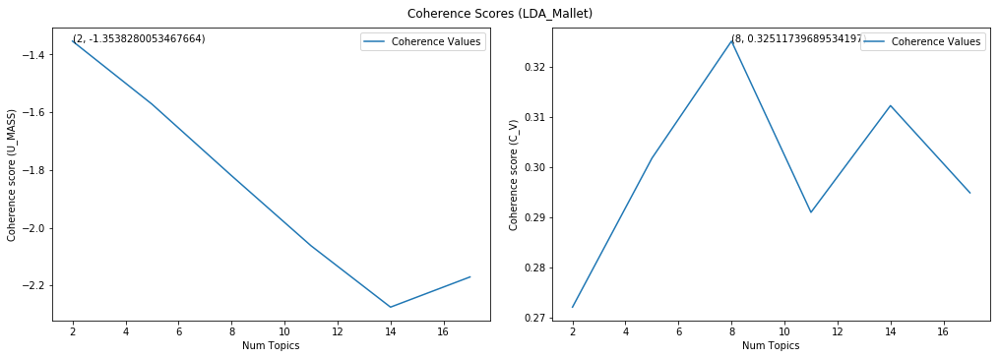

The most coherent number of LDA_Mallet topics using the U_MASS measure is: 2
The most coherent number of LDA_Mallet topics using the C_V measure is: 8


The most coherent number of LDA_Mallet topics to use is: 8


In [54]:
best_num_ldamallet_topics = show_best_num_topics('LDA_Mallet', coh_list_ldamallet_umass, coh_list_ldamallet_cv, max_topics=20, min_topics=2, stride=3)
print('The most coherent number of LDA_Mallet topics to use is: {}'.format(best_num_ldamallet_topics))

In [55]:
lda_mallet = LdaMallet(mallet_path, corpus=corpus, num_topics=best_num_ldamallet_topics, id2word=dictionary)

In [60]:
#topics_matrix = lda_mallet.show_topics(formatted=True, num_words=20)
#topics_matrix = np.array(topics_matrix)
#topics_matrix.shape

In [61]:
#topic_words = topics_matrix[:,1]
#for i in topic_words:
#    print([reg_ex.sub('', w) for w in i.split() if len(reg_ex.sub('', w)) > 0])
#    print('\n')

In [56]:
lda_mallet_df = get_topics(lda_mallet, best_num_ldamallet_topics)
#print(lda_mallet_df)
lda_mallet_df

,Topic # 01,Topic # 02,Topic # 03,Topic # 04,Topic # 05,Topic # 06,Topic # 07,Topic # 08
0,story,house,scene,watch,scene,performance,character,time
1,ghost,plot,dark,original,vampire,actor,people,feel
2,love,scare,story,fan,shoot,creepy,dont,leave
3,end,story,work,ism,girl,story,sound,doesnt
4,scary,genre,ring,dont,work,room,live,character
5,play,family,psychological,youre,days,years,thriller,story
6,short,audience,twist,remake,night,release,kill,dont
7,world,haunt,excellent,minute,town,time,love,watch
8,time,true,water,flick,woman,year,killer,sense
9,start,add,tale,ive,nature,night,play,start


In [57]:
ldamallet_hellinger_topic_distances = get_most_similar_topics(lda_mallet, lda_mallet_df, num_topics=best_num_ldamallet_topics, mallet_flag=True)
pretty_print(ldamallet_hellinger_topic_distances)

Hellinger Distances between topics are: 

______________________________________________________________________


(0.9545340440576985, 'Topic # 04', 'Topic # 05')
 (0.9426037977006119, 'Topic # 03', 'Topic # 04')
 (0.9359234608592298, 'Topic # 02', 'Topic # 07')
 (0.9341593554859184, 'Topic # 04', 'Topic # 06')
 (0.9340884820207142, 'Topic # 01', 'Topic # 04')
 (0.9316609666635765, 'Topic # 06', 'Topic # 08')
 (0.9258880611682975, 'Topic # 05', 'Topic # 06')
 (0.9247568336998111, 'Topic # 03', 'Topic # 07')
 (0.924315383410101, 'Topic # 05', 'Topic # 08')
 (0.9237283410570338, 'Topic # 04', 'Topic # 07')
 (0.9218963025154837, 'Topic # 02', 'Topic # 05')
 (0.9215309384100554, 'Topic # 06', 'Topic # 07')
 (0.9189364773675167, 'Topic # 04', 'Topic # 08')
 (0.9178189761080324, 'Topic # 02', 'Topic # 04')
 (0.9145282089633445, 'Topic # 03', 'Topic # 05')
 (0.9108689923818001, 'Topic # 05', 'Topic # 07')
 (0.9091161059483536, 'Topic # 01', 'Topic # 03')
 (0.9087474646722671, 'Topic # 01', '

In [58]:
lda_mallet_dom_topics_df, lda_mallet_dom_topics_final = get_dominant_topics(lda_mallet, corpus, all_reviews_joined)

In [59]:
#lda_mallet_dom_topics_final.style.applymap(color_green).applymap(make_bold)
lda_mallet_dom_topics_final_first30 = lda_mallet_dom_topics_final.head(30)
lda_mallet_dom_topics_final_first30.style.applymap(color_green).applymap(make_bold)

,Dominant_Topic,Probability_Contribution,Topic_Keywords,Original_Text
Document_Number,,,,
0,1,0.2769,"house, plot, scare, story, genre, family, audience, haunt, true, add, doesnt, act, feel, music, sinister, day, conjuring, eye, element, character",coherent plot tell non-straightforward fashion open interpretations leave require audience fill-in open end possibly filling-in require viewings considerable think sense watch wailing time impression kind watch ponder read watch attempt people interpret explain different conclusion coherent underlie plot matt shift piece puzzle attempt recreate coherent narrative piece fit incompetence underlie story possibly intentionally possibly fundamentally inconsistent optical illusion escher drawing appear describe physical object fact dont physical sense accordingly enjoy boil content technically well-made cinematography acting costumes plot sense tell deceptive lure think plot sense matt sufficient thought leave lingering irritate feel dissatisfaction confusion maybe precisely point tell story purpose instill audience feel confusion face sequence event sense life times
1,2,0.2751,"scene, dark, story, work, ring, psychological, twist, excellent, water, tale, performance, fact, slowly, american, japanese, brilliant, revenge, viewer, perfect, pretty",spoiler review extraordinary hour technically-perfect humanistic fine writer directors business hauteur saw devil cipher close analog suggest david lynches 2001 mulholland drive technically perfect humanistic suspense opus captivate length walk theatre shake head wonder saw film-makers understand secret story tell present story viewer feel share experience protagonist tell story viewer going provide explanation wailing means re-quote writer director numerous interview enigmatically begin wonder nature god -- recommended levels entertainment puzzled clinic engage wont let
2,7,0.4288,"time, feel, leave, doesnt, character, story, dont, watch, sense, start, happen, end, didnt, friend, real, understand, scary, people, characters, hard",wailing open quote bible easy forget fact watch certain point clear purpose quote served warning religious person scare wailing work religious parables overcome lengthy run time tonal imbalanced deliver funny truly terrify mysterious strange small village south korean village plague sickness police think wild mushroom blame police officer jong-goo think stranger meet woman information mysterious man slowly begin fall rabbit hole consume life daughter start sign sickness personal figure trust avoid director hong-jin nap struggle tonal balance time pitch perfect time place tone struggle stay consistent primarily funny brief burst depravity violence comedy work laugh numb times horrific imagery sudden effective balance lose act comedy slapstick fit rest character over-the-top act exaggerate different introduced middle section moment unintentional humor example man strike lighten caller id shaman phone shaman fortunately balance act smartly switch act intense terrify moment comedy offset terrify act start unfold audience gain new appreciation rest start reinterpret certain scenes problem scene sense ended feel natural fit story progressed require end sense hour minutes middle portion resolved shaman screen time perform ritual end important zombie scene feel awkward didnt fit rest want zombie grow popularity scene bring numb random character serve purpose rest despite scene previously mention overacting act generally speak fantastic father task solve happen daughter convey terror hatred build intense persona carry priest train advice father equally effective bring concern innocent quality terror ultimately happen young daughter sick shines channeling inner linda blair emphatically deliver horrible dirty line child performance truly terrify watch hatred eye slowly end religious overtone clearer locusts attack individual white black suggest characters true nature scene truly shines slowly unveil real nature certain characters m

In [60]:
lda_mallet_most_representative_docs = get_most_representative_docs(lda_mallet_dom_topics_final, n_topics=20)
lda_mallet_most_representative_docs.style.applymap(color_green).applymap(make_bold)

,Probability_Contribution,Topic_Keywords,Most_Representative_Document
Topic_Number,,,
0,0.1352,"story, ghost, love, end, scary, play, short, world, time, start, creepy, work, suspense, bite, funny, moment, hollywood, atmosphere, genre, canst",zombie plenty thistle cheerleader splendid gods gift debut story peter end
1,0.1492,"house, plot, scare, story, genre, family, audience, haunt, true, add, doesnt, act, feel, music, sinister, day, conjuring, eye, element, character",soon plot tranquil set family soon silence shatter event unit fall apart normal usual nowadays marvel fantasy disney release week usual helen murren samuel jackson jump consequence violence blood sexiness zaniness rest break ordinary case masterful let freely admit man power legs breasts hair hike skirt sex excited cold fish cut
2,0.1617,"scene, dark, story, work, ring, psychological, twist, excellent, water, tale, performance, fact, slowly, american, japanese, brilliant, revenge, viewer, perfect, pretty",unlike reviews ism cheap shot ju-on fan supernatural owe decide wholeheartedly agree uncomfortable watch experience powerful ring dark water exorcista scary scary stuff
3,0.1515,"watch, original, fan, ism, dont, youre, remake, minute, flick, ive, dead, people, enjoy, bad, movies, classic, time, wasnt, love, expect",soon plot tranquil set family soon silence shatter event unit fall apart normal usual nowadays marvel fantasy disney release week usual helen murren samuel jackson jump consequence violence blood sexiness zaniness rest break ordinary case masterful let freely admit man power legs breasts hair hike skirt sex excited cold fish cut
4,0.1709,"scene, vampire, shoot, girl, work, days, night, town, woman, nature, guy, plot, life, zombie, home, experience, wife, shadow, real, follow",different zombies army undead create industrial mishap result overwhelm chaos danger address morality root cause personally love pretty woman enjoy leg beautiful hair girl hat
5,0.1399,"performance, actor, creepy, story, room, years, release, time, year, night, young, genre, director, play, stand, treat, fan, set, title, cinematography",fantastic performance start james mcevoy reason watch personality display distinct interest watch anya breath-taking witch fine job took night shyamalan reassert director follow string poor absolutely wait sequel conclusion unbreakable series arrive january
6,0.1538,"character, people, dont, sound, live, thriller, kill, love, killer, play, end, feel, situation, place, time, world, school, problem, young, high",ive read review ism die hard thriller fan think slow- bad ism build ending actress play eden think cast better ill worth watch thrillers
7,0.1423,"time, feel, leave, doesnt, character, story, dont, watch, sense, start, happen, end, didnt, friend, real, understand, scary, people, characters, hard",point mince words brad anderson session ive time intelligent well-written completely unpredictable look didnt notice view edit photography work soundtrack downright creepy recently manage lie awake night dario argentous opera tobe hoopers texas chain saw massacre list include honestly excuse folks doesnt


In [61]:
lda_mallet_topic_dist = get_topic_distribution(lda_mallet_dom_topics_final, lda_mallet_most_representative_docs, n_topics=20)
lda_mallet_topic_dist.style.applymap(color_green).applymap(make_bold)

,Documents_per_Topic,Percent_of_Total_Corpus,Topic_Keywords
Topic_Number,,,
0,120,0.12,"story, ghost, love, end, scary, play, short, world, time, start, creepy, work, suspense, bite, funny, moment, hollywood, atmosphere, genre, canst"
1,110,0.11,"house, plot, scare, story, genre, family, audience, haunt, true, add, doesnt, act, feel, music, sinister, day, conjuring, eye, element, character"
2,133,0.133,"scene, dark, story, work, ring, psychological, twist, excellent, water, tale, performance, fact, slowly, american, japanese, brilliant, revenge, viewer, perfect, pretty"
3,201,0.201,"watch, original, fan, ism, dont, youre, remake, minute, flick, ive, dead, people, enjoy, bad, movies, classic, time, wasnt, love, expect"
4,84,0.084,"scene, vampire, shoot, girl, work, days, night, town, woman, nature, guy, plot, life, zombie, home, experience, wife, shadow, real, follow"
5,96,0.096,"performance, actor, creepy, story, room, years, release, time, year, night, young, genre, director, play, stand, treat, fan, set, title, cinematography"
6,110,0.11,"character, people, dont, sound, live, thriller, kill, love, killer, play, end, feel, situation, place, time, world, school, problem, young, high"
7,146,0.146,"time, feel, leave, doesnt, character, story, dont, watch, sense, start, happen, end, didnt, friend, real, understand, scary, people, characters, hard"


In [68]:
#NOTE: .malletmodel2ldamodel() is buggy!
    #Cf. https://github.com/RaRe-Technologies/gensim/issues/1203
    #Cf. https://github.com/RaRe-Technologies/gensim/issues/2069
    
#For workaround, Cf. http://jeriwieringa.com/2018/07/17/pyLDAviz-and-Mallet/#comment-4018495276

#mallet_2_lda_mod = gensim.models.wrappers.ldamallet.malletmodel2ldamodel(lda_mallet)
#prepared = pyLDAvis.gensim.prepare(mallet_2_lda_mod, corpus, dictionary)
#display(pyLDAvis.display(prepared))

### LDA Mallet: Second Pass with second highest C_V Coherence Optimized number of topics

In [62]:
lda_mallet_2 = LdaMallet(mallet_path, corpus=corpus, num_topics=14, id2word=dictionary)

In [64]:
lda_mallet_df_2 = get_topics(lda_mallet_2, 14)
#print(lda_mallet_df_2)
lda_mallet_df_2

,Topic # 01,Topic # 02,Topic # 03,Topic # 04,Topic # 05,Topic # 06,Topic # 07,Topic # 08,Topic # 09,Topic # 10,Topic # 11,Topic # 12,Topic # 13,Topic # 14
0,style,original,dont,scare,work,story,scene,people,story,sound,house,people,zombie,family
1,vampire,watch,character,scary,nature,end,story,story,ghost,time,didnt,feel,people,youre
2,scene,fan,room,ive,woman,play,dark,watch,sinister,love,story,friend,shoot,work
3,feel,remake,time,jump,wrong,short,ring,scene,love,character,feel,character,dead,twist
4,cinematography,classic,thriller,watch,fall,fun,real,turn,director,ism,plot,leave,days,expect
5,brilliant,flick,ive,haunt,describe,time,watch,character,scary,dont,girl,real,ride,start
6,excellent,dead,story,real,director,creepy,sense,viewer,home,live,guy,japanese,attack,add
7,ism,treat,past,creepy,mind,director,plot,reason,fan,monster,happen,life,scene,end
8,music,gore,play,time,fear,bite,water,blood,cast,hear,kid,world,character,dont
9,tale,year,work,doesnt,include,start,visual,truth,atmosphere,pretty,night,act,tension,characters


In [115]:
ldamallet_hellinger_topic_distances_2 = get_most_similar_topics(lda_mallet_2, lda_mallet_df_2, num_topics=14, mallet_flag=True)
pretty_print(ldamallet_hellinger_topic_distances_2)

Hellinger Distances between topics are: 

______________________________________________________________________


(0.9640064905425804, 'Topic # 02', 'Topic # 07')
 (0.9630872911656057, 'Topic # 05', 'Topic # 11')
 (0.959551339144133, 'Topic # 04', 'Topic # 05')
 (0.9583074176732344, 'Topic # 09', 'Topic # 13')
 (0.9572472126294248, 'Topic # 02', 'Topic # 11')
 (0.9572410852906693, 'Topic # 06', 'Topic # 13')
 (0.9564785062656007, 'Topic # 09', 'Topic # 11')
 (0.9515582230378915, 'Topic # 04', 'Topic # 10')
 (0.9512168721624514, 'Topic # 04', 'Topic # 13')
 (0.9502617007912305, 'Topic # 09', 'Topic # 10')
 (0.9499244066667502, 'Topic # 02', 'Topic # 05')
 (0.9468286136008315, 'Topic # 02', 'Topic # 13')
 (0.9430261325783785, 'Topic # 05', 'Topic # 06')
 (0.9425823285725585, 'Topic # 06', 'Topic # 12')
 (0.9420040275533847, 'Topic # 01', 'Topic # 05')
 (0.9417975252917109, 'Topic # 02', 'Topic # 03')
 (0.9402472926059382, 'Topic # 02', 'Topic # 08')
 (0.9402072660218292, 'Topic # 13', '

In [66]:
lda_mallet_dom_topics_df_2, lda_mallet_dom_topics_final_2 = get_dominant_topics(lda_mallet_2, corpus, all_reviews_joined)

In [67]:
#lda_mallet_dom_topics_final_2.style.applymap(color_green).applymap(make_bold)
lda_mallet_dom_topics_final_first30_2 = lda_mallet_dom_topics_final_2.head(30)
lda_mallet_dom_topics_final_first30_2.style.applymap(color_green).applymap(make_bold)

,Dominant_Topic,Probability_Contribution,Topic_Keywords,Original_Text
Document_Number,,,,
0,6,0.449,"scene, story, dark, ring, real, watch, sense, plot, water, visual, time, david, experience, point, face, resolution, sound, realize, weird, mike",coherent plot tell non-straightforward fashion open interpretations leave require audience fill-in open end possibly filling-in require viewings considerable think sense watch wailing time impression kind watch ponder read watch attempt people interpret explain different conclusion coherent underlie plot matt shift piece puzzle attempt recreate coherent narrative piece fit incompetence underlie story possibly intentionally possibly fundamentally inconsistent optical illusion escher drawing appear describe physical object fact dont physical sense accordingly enjoy boil content technically well-made cinematography acting costumes plot sense tell deceptive lure think plot sense matt sufficient thought leave lingering irritate feel dissatisfaction confusion maybe precisely point tell story purpose instill audience feel confusion face sequence event sense life times
1,6,0.1745,"scene, story, dark, ring, real, watch, sense, plot, water, visual, time, david, experience, point, face, resolution, sound, realize, weird, mike",spoiler review extraordinary hour technically-perfect humanistic fine writer directors business hauteur saw devil cipher close analog suggest david lynches 2001 mulholland drive technically perfect humanistic suspense opus captivate length walk theatre shake head wonder saw film-makers understand secret story tell present story viewer feel share experience protagonist tell story viewer going provide explanation wailing means re-quote writer director numerous interview enigmatically begin wonder nature god -- recommended levels entertainment puzzled clinic engage wont let
2,6,0.2982,"scene, story, dark, ring, real, watch, sense, plot, water, visual, time, david, experience, point, face, resolution, sound, realize, weird, mike",wailing open quote bible easy forget fact watch certain point clear purpose quote served warning religious person scare wailing work religious parables overcome lengthy run time tonal imbalanced deliver funny truly terrify mysterious strange small village south korean village plague sickness police think wild mushroom blame police officer jong-goo think stranger meet woman information mysterious man slowly begin fall rabbit hole consume life daughter start sign sickness personal figure trust avoid director hong-jin nap struggle tonal balance time pitch perfect time place tone struggle stay consistent primarily funny brief burst depravity violence comedy work laugh numb times horrific imagery sudden effective balance lose act comedy slapstick fit rest character over-the-top act exaggerate different introduced middle section moment unintentional humor example man strike lighten caller id shaman phone shaman fortunately balance act smartly switch act intense terrify moment comedy offset terrify act start unfold audience gain new appreciation rest start reinterpret certain scenes problem scene sense ended feel natural fit story progressed require end sense hour minutes middle portion resolved shaman screen time perform ritual end important zombie scene feel awkward didnt fit rest want zombie grow popularity scene bring numb random character serve purpose rest despite scene previously mention overacting act generally speak fantastic father task solve happen daughter convey terror hatred build intense persona carry priest train advice father equally effective bring concern innocent quality terror ultimately happen young daughter sick shines channeling inner linda blair emphatically deliver horrible dirty line child performance truly terrify watch hatred eye slowly end religious overtone clearer locusts attack individual white black suggest characters true nature scene truly shines slowly unveil real nature certain characters minute change perspective things

In [68]:
lda_mallet_most_representative_docs_2 = get_most_representative_docs(lda_mallet_dom_topics_final_2, n_topics=20)
lda_mallet_most_representative_docs_2.style.applymap(color_green).applymap(make_bold)

,Probability_Contribution,Topic_Keywords,Most_Representative_Document
Topic_Number,,,
0,0.11,"style, vampire, scene, feel, cinematography, brilliant, excellent, ism, music, tale, line, set, bad, genre, place, beautiful, atmosphere, girl, absolutely, kind",think true original break sweat certain points physical effect audience astonish moment scene transition literally breathtaking didnt believe director certain solely shock people suggested look lush style stun compositions favourite story final sickly grandson original character source hukkle want director interest time linger mind
1,0.1054,"original, watch, fan, remake, classic, flick, dead, treat, gore, year, evil, release, trick, enjoy, fans, performance, genre, sequel, teen, fun",create extremely tense atmosphere moment starts plenty gore violence bombard eyes mention twist watch night light expect freak think typical instead completely intrigue story line utterly draw 100 minutes end feel scared feel offer satisfaction leave slightly disturb thoughtful state nightmares plague day-dreams day thought stray far thats powerful want cringingly gory violent watch texas chainsaw massacre hostel want nightmarishly scary watch grudge ring want clever disturb excellent story twist watch saw
2,0.0859,"dont, character, room, time, thriller, ive, story, past, play, work, doesnt, 1408, writer, things, write, twist, ll, john, read, director",zombie plenty thistle cheerleader splendid gods gift debut story peter end
3,0.1174,"scare, scary, ive, jump, watch, haunt, real, creepy, time, doesnt, extremely, vampire, conjuring, performance, genre, james, theyre, feel, music, scares",unlike reviews ism cheap shot ju-on fan supernatural owe decide wholeheartedly agree uncomfortable watch experience powerful ring dark water exorcista scary scary stuff
4,0.1067,"work, nature, woman, wrong, fall, describe, director, mind, fear, include, case, pain, child, death, characters, emotion, love, psychological, hard, emotional",soon plot tranquil set family soon silence shatter event unit fall apart normal usual nowadays marvel fantasy disney release week usual helen murren samuel jackson jump consequence violence blood sexiness zaniness rest break ordinary case masterful let freely admit man power legs breasts hair hike skirt sex excited cold fish cut
5,0.0836,"story, end, play, short, fun, time, creepy, director, bite, start, surprise, funny, pretty, suspense, bring, minute, night, gore, clich, fan",plot summary describe story scary funny
6,0.1194,"scene, story, dark, ring, real, watch, sense, plot, water, visual, time, david, experience, point, face, resolution, sound, realize, weird, mike",ive member idb year rarely time comment addition watch average 10-15 months split genre include lately thought ive disenfranchise proliferation shock hostel late saw captivity enter mist leave theater movies frank darabont adapt steven king novel short stories period bring human balance thats miss days unbelievable maybe ludicrous situation events character believable peel layer expose fear prejudice vulnerability foundation effective absolutely grip entire all-too-rare-these-days sense dread permeate scene leave emotionally exhaust end speak ending isnt talk ism opinion love split camp loved didn t conclusion entire storyline human condition wouldnt change things
7,0.1102,"people, story, watch, scene, turn, character, viewer, reason, blood, truth, plot, feel, game, idea, camera, body, review, raw, isnt, work",usually comment read peoples comments finish watch rec feel comment heart rate let hell terrify think dont repeat synopsis people story doesnt original zombie claustrophobic set totally different brilliant let place apartment building limit space person shoot add claustrophobic atmosphere scare wont mile hollywood movies shocking ending flick seen literally believe hollywood watch learn dont need gallon blood body fly scare live hell
8,0.1157,"story, ghost, sinister, love, director, scary, home, fan, cast, atm

In [69]:
lda_mallet_topic_dist_2 = get_topic_distribution(lda_mallet_dom_topics_final_2, lda_mallet_most_representative_docs_2, n_topics=20)
lda_mallet_topic_dist_2.style.applymap(color_green).applymap(make_bold)

,Documents_per_Topic,Percent_of_Total_Corpus,Topic_Keywords
Topic_Number,,,
0,79,0.079,"style, vampire, scene, feel, cinematography, brilliant, excellent, ism, music, tale, line, set, bad, genre, place, beautiful, atmosphere, girl, absolutely, kind"
1,100,0.1,"original, watch, fan, remake, classic, flick, dead, treat, gore, year, evil, release, trick, enjoy, fans, performance, genre, sequel, teen, fun"
2,92,0.092,"dont, character, room, time, thriller, ive, story, past, play, work, doesnt, 1408, writer, things, write, twist, ll, john, read, director"
3,94,0.094,"scare, scary, ive, jump, watch, haunt, real, creepy, time, doesnt, extremely, vampire, conjuring, performance, genre, james, theyre, feel, music, scares"
4,36,0.036,"work, nature, woman, wrong, fall, describe, director, mind, fear, include, case, pain, child, death, characters, emotion, love, psychological, hard, emotional"
5,84,0.084,"story, end, play, short, fun, time, creepy, director, bite, start, surprise, funny, pretty, suspense, bring, minute, night, gore, clich, fan"
6,63,0.063,"scene, story, dark, ring, real, watch, sense, plot, water, visual, time, david, experience, point, face, resolution, sound, realize, weird, mike"
7,65,0.065,"people, story, watch, scene, turn, character, viewer, reason, blood, truth, plot, feel, game, idea, camera, body, review, raw, isnt, work"
8,63,0.063,"story, ghost, sinister, love, director, scary, home, fan, cast, atmosphere, family, war, child, supernatural, element, screen, orphanage, house, simple, young"


# HDP (Hierarchical Dirichlet Process)

## Cf. http://proceedings.mlr.press/v15/wang11a/wang11a.pdf

In [70]:
hdp = models.HdpModel(corpus, id2word=dictionary, chunksize=1000, random_state=222)

In [100]:
#hdp_topics_matrix = hdp.show_topics(formatted=True, num_words=20)

In [101]:
#hdp_topics_matrix = np.array(hdp_topics_matrix)

#hdp_topics_matrix.shape

In [102]:
#hdp_topic_words = hdp_topics_matrix[:,1]
#for i in hdp_topic_words:
#    print([reg_ex.sub('', w) for w in i.split() if len(reg_ex.sub('', w)) > 0])
#    print('\n')

In [116]:
hdp_df = get_topics(hdp, 20)
#print(hdp_df)
hdp_df

,Topic # 01,Topic # 02,Topic # 03,Topic # 04,Topic # 05,Topic # 06,Topic # 07,Topic # 08,Topic # 09,Topic # 10,Topic # 11,Topic # 12,Topic # 13,Topic # 14,Topic # 15,Topic # 16,Topic # 17,Topic # 18,Topic # 19,Topic # 20
0,room,story,scare,prof,park,water,character,salinsageonui,carmen,button,watch,remote-control,dont,boyle,tail,woods,lawn,weak-stomached,elves,rationalism
1,story,short,mysterious,laurier,metamorphosis,scene,strange,sewer,chainsaw,person,cinematically,benji,rowlands,progresses,resolution,starkly,twitch,dimension,roth,unearthly
2,1408,uncertainty,recovery,dont,talked,funeral,staples,idea,outcasts,plot,repopulate,shouts,department,hour,gozu,e-bay,unease,abuses,slicks,declining
3,character,role,gleeful,story,convict,sarsgaard,instance,plot-heavy,petty,live,burned,biblical,room,catwalk,inexplicable,wood,mentally,wee,hoodoo,meandering
4,hard-pressed,watch,feel,minami,ism,yoshimi,frightened,tab,se7en,essence,slapstick,two-story,police,rarely,walls,audience,vampire,centre,days,gate
5,play,fun,place,rides,exit,feel,time,angina,jolts,reveal,confessions,produce,someones,trash,calmly,george,ein,suspects,slam-bang,ignite
6,time,grotesque,favorite,think,attacks,diner,mix,visitors,girls,paste,fault,scandal,ride,post-birthday,titanic,tommy,wonder,issue,disturbance,starting
7,feel,pretty,styx,icon,abandonment,tight,novelized,faces,911,people,korea,archetype,mind-blowing,higher,fears,horrifying,horror-thrillers,simple-minded,et,malice
8,irreversible,theme,wonderous,le,imbalanced,adage,strong,london-town,hollow,su-mi,resist,jungle,expense,stringy,story,greatness,jeong-min,eager,red-eye,zack
9,work,time,look,mr,truth,chainsaws,isi,jesses,paula,jurassic,institute,shaman,2010,couple,fukikoshi,shower,estrange,toro,fanatical,lost--this


In [117]:
hdp_hellinger_topic_distances = get_most_similar_topics(hdp, hdp_df, hdp_flag=True)
pretty_print(hdp_hellinger_topic_distances)

Hellinger Distances between topics are: 

______________________________________________________________________


(0.18165902124584954, 'Topic # 06', 'Topic # 19')
 (0.18165902124584954, 'Topic # 01', 'Topic # 19')
 (0.1802775637731995, 'Topic # 17', 'Topic # 19')
 (0.1802775637731995, 'Topic # 06', 'Topic # 17')
 (0.1802775637731995, 'Topic # 01', 'Topic # 17')
 (0.17748239349298853, 'Topic # 19', 'Topic # 20')
 (0.17748239349298853, 'Topic # 06', 'Topic # 20')
 (0.17748239349298853, 'Topic # 02', 'Topic # 19')
 (0.17748239349298853, 'Topic # 02', 'Topic # 06')
 (0.17606816861659014, 'Topic # 18', 'Topic # 19')
 (0.17606816861659014, 'Topic # 17', 'Topic # 20')
 (0.17606816861659014, 'Topic # 06', 'Topic # 18')
 (0.17606816861659014, 'Topic # 02', 'Topic # 17')
 (0.17606816861659014, 'Topic # 01', 'Topic # 18')
 (0.17606816861659014, 'Topic # 01', 'Topic # 06')
 (0.17464249196572987, 'Topic # 17', 'Topic # 18')
 (0.17464249196572987, 'Topic # 16', 'Topic # 19')
 (0.17464249196572987,

In [118]:
hdp_dom_topics_df, hdp_dom_topics_final = get_dominant_topics(hdp, corpus, all_reviews_joined)

In [119]:
#hdp_dom_topics_final.style.applymap(color_green).applymap(make_bold)
hdp_dom_topics_final_first30 = hdp_dom_topics_final.head(30)
hdp_dom_topics_final_first30.style.applymap(color_green).applymap(make_bold)

,Dominant_Topic,Probability_Contribution,Topic_Keywords,Original_Text
Document_Number,,,,
0,3,0.9912,"prof, laurier, dont, story, minami, rides, think, icon, le, mr, texas, peasant, marriage, push, melodramatics, tightly-wired, bewilder, titular, similarities, deceitfully",coherent plot tell non-straightforward fashion open interpretations leave require audience fill-in open end possibly filling-in require viewings considerable think sense watch wailing time impression kind watch ponder read watch attempt people interpret explain different conclusion coherent underlie plot matt shift piece puzzle attempt recreate coherent narrative piece fit incompetence underlie story possibly intentionally possibly fundamentally inconsistent optical illusion escher drawing appear describe physical object fact dont physical sense accordingly enjoy boil content technically well-made cinematography acting costumes plot sense tell deceptive lure think plot sense matt sufficient thought leave lingering irritate feel dissatisfaction confusion maybe precisely point tell story purpose instill audience feel confusion face sequence event sense life times
1,48,0.6778,"bland, mani, onijala, multi-faceted, crawl, meaning-symbolism, keyboard, favourite, metaphor, sarsgaard, 1765, honk, elses, iowa, guy-friend, gladiator, treatment, 140, circumstances, notice",spoiler review extraordinary hour technically-perfect humanistic fine writer directors business hauteur saw devil cipher close analog suggest david lynches 2001 mulholland drive technically perfect humanistic suspense opus captivate length walk theatre shake head wonder saw film-makers understand secret story tell present story viewer feel share experience protagonist tell story viewer going provide explanation wailing means re-quote writer director numerous interview enigmatically begin wonder nature god -- recommended levels entertainment puzzled clinic engage wont let
2,28,0.9969,"story, kurt, query, misspelling, recipient, work, rheda, sealed, steve, evict, act, flying, drink, daughter, nuts, gimmicks, scarcity, titillating, overlap, cartoony",wailing open quote bible easy forget fact watch certain point clear purpose quote served warning religious person scare wailing work religious parables overcome lengthy run time tonal imbalanced deliver funny truly terrify mysterious strange small village south korean village plague sickness police think wild mushroom blame police officer jong-goo think stranger meet woman information mysterious man slowly begin fall rabbit hole consume life daughter start sign sickness personal figure trust avoid director hong-jin nap struggle tonal balance time pitch perfect time place tone struggle stay consistent primarily funny brief burst depravity violence comedy work laugh numb times horrific imagery sudden effective balance lose act comedy slapstick fit rest character over-the-top act exaggerate different introduced middle section moment unintentional humor example man strike lighten caller id shaman phone shaman fortunately balance act smartly switch act intense terrify moment comedy offset terrify act start unfold audience gain new appreciation rest start reinterpret certain scenes problem scene sense ended feel natural fit story progressed require end sense hour minutes middle portion resolved shaman screen time perform ritual end important zombie scene feel awkward didnt fit rest want zombie grow popularity scene bring numb random character serve purpose rest despite scene previously mention overacting act generally speak fantastic father task solve happen daughter convey terror hatred build intense persona carry priest train advice father equally effective bring concern innocent quality terror ultimately happen young daughter sick shines channeling inner linda blair emphatically deliver horrible dirty line child performance truly terrify watch hatred eye slowly end religious overtone clearer locusts attack individual white black suggest characters true nature 

In [120]:
hdp_most_representative_docs = get_most_representative_docs(hdp_dom_topics_final, n_topics=20)
hdp_most_representative_docs.style.applymap(color_green).applymap(make_bold)

,Probability_Contribution,Topic_Keywords,Most_Representative_Document
Topic_Number,,,
0,0.3079,"room, story, 1408, character, hard-pressed, play, time, feel, irreversible, work, new, mist, similar, cusack, edition, ripped-to-shreds, perversely, noise, progress, bubblegum",anthology sum parts particular set stack novice young man trouble past leave live monks karma catch interesting idea lack execution bite bore end ward injure teenager spend night hospital room brain dead old man respirator slate life support day spooky violent twist ending backpackers favorite bunch young hitchhiker pick trucker cargo dangerous id love salvage dishonest car saleswoman terrify night vehicle return angry customer son disappears gruesome ghost story feature karma main theme end funny subversive tale spooky long-haired ghost girl east frequently 10+ years phobia rocky start overall entertain vary mix thai
1,0.2765,"story, short, uncertainty, role, watch, fun, grotesque, pretty, theme, time, resistance, handel, trade, purikitpanya, behaviors, victorian, home, ameliorate, look, dubbed",poke fun general youre look cradle scare lady-friend watch southpark britney spears episode parallel matt stone trey parker draw modern culture glorify celebrity ancient sacrifice god ensure harvest same- create reality tv type scenario main character walk step clich joker jock slut nerd virgin elaborate version kind sacrifice genre supply endless stream blood satisfy ancient need character clich notice falling cast role human tip hat writers joss clever beasts pure horror- thats point enjoy commentary narrative develope didnt head happening edge interest end point sit think wow fun definitely fun watch
2,0.3555,"scare, mysterious, recovery, gleeful, feel, place, favorite, styx, wonderous, look, chance, based, deteriorate, character, adage, clich, time, seek, story, support",plot solid entertain mean want new watch genre- entertain lore improve story flashback creative storytelling gem minute doesnt provide time viewer understand evil descend family tell bit piece owner run funeral parlour home owner dagmar hide sell body house build ancient evil leave guess heck rest story old boiler downstairs minute screen time flesh sordid past leave satisfy true understand house evil past leave gore fest jump scare new old fashion star rating
3,0.582,"prof, laurier, dont, story, minami, rides, think, icon, le, mr, texas, peasant, marriage, push, melodramatics, tightly-wired, bewilder, titular, similarities, deceitfully",point mince words brad anderson session ive time intelligent well-written completely unpredictable look didnt notice view edit photography work soundtrack downright creepy recently manage lie awake night dario argentous opera tobe hoopers texas chain saw massacre list include honestly excuse folks doesnt
4,0.2166,"park, metamorphosis, talked, convict, ism, exit, attacks, abandonment, imbalanced, truth, begun, foggiest, cops, bolt, impeccably, limbless, people, chase, money-obsessed, atv",massive fan leave completely cold mean spirited cold unbelievably frustrate stupid times plus act involved lack logic place complete lack satisfy pay merit quickly outweighed example lead character think okay wonder people home consent lead bizarre random mobile phone suspension disbelief lose appropriate response doh ending terrorisation expect decent pay instead downbeats nihilistic sign popular modern miss point somewhat experience unpleasant hate work people
5,0.9157,"water, scene, funeral, sarsgaard, yoshimi, feel, diner, tight, adage, chainsaws, misunderstand, silk, neighbours, ing, secretary, outer, dark, afterthought, self-sacrifice, reveal",hell ride minute stop look time leave relieved left thats engage interest story watch read review smorgasbord genre positive review doesnt feel means yes storytelling fluid write multiple genre aspect didnt feel place works work feel redundant point genres similar witch necessarily term storyline pace severity terror psychological wai

In [121]:
hdp_topic_dist = get_topic_distribution(hdp_dom_topics_final, n_topics=20, hdp_flag=True)
hdp_topic_dist.style.applymap(color_green).applymap(make_bold)

,Documents_per_Topic,Percent_of_Total_Corpus,Topic_Keywords
Topic_Number,,,
0,66,0.066,"room, story, 1408, character, hard-pressed, play, time, feel, irreversible, work, new, mist, similar, cusack, edition, ripped-to-shreds, perversely, noise, progress, bubblegum"
1,58,0.058,"story, short, uncertainty, role, watch, fun, grotesque, pretty, theme, time, resistance, handel, trade, purikitpanya, behaviors, victorian, home, ameliorate, look, dubbed"
2,26,0.026,"scare, mysterious, recovery, gleeful, feel, place, favorite, styx, wonderous, look, chance, based, deteriorate, character, adage, clich, time, seek, story, support"
3,20,0.02,"prof, laurier, dont, story, minami, rides, think, icon, le, mr, texas, peasant, marriage, push, melodramatics, tightly-wired, bewilder, titular, similarities, deceitfully"
4,18,0.018,"park, metamorphosis, talked, convict, ism, exit, attacks, abandonment, imbalanced, truth, begun, foggiest, cops, bolt, impeccably, limbless, people, chase, money-obsessed, atv"
5,16,0.016,"water, scene, funeral, sarsgaard, yoshimi, feel, diner, tight, adage, chainsaws, misunderstand, silk, neighbours, ing, secretary, outer, dark, afterthought, self-sacrifice, reveal"
6,22,0.022,"character, strange, staples, instance, frightened, time, mix, novelized, strong, isi, sleep, misshapen, human, faith, cock, stylization, characters, dont, lippi, phobia"
7,14,0.014,"salinsageonui, sewer, idea, plot-heavy, tab, angina, visitors, faces, london-town, jesses, eery, response, decoration, negotiable, produce, meshes, so-so, grizzly, hills, spring"
8,18,0.018,"carmen, chainsaw, outcasts, petty, se7en, jolts, girls, 911, hollow, paula, safe, require, nullify, stillness, iranian, suppress, vampire, think, diverse, epilepticmoondancer"


In [122]:
hdp_topics = []
for topic_id, topic in hdp.show_topics(num_topics=20, formatted=False):
    topic = [word for word, _ in topic]
    hdp_topics.append(topic)

In [123]:
hdp_cm_umass = CoherenceModel(topics=hdp_topics, corpus=corpus, dictionary=dictionary, coherence='u_mass')
print('The U_MASS coherence measure of the HDP Model is: {}'.format(hdp_cm_umass.get_coherence()))

The U_MASS coherence measure of the HDP Model is: -17.870792618102282


In [124]:
hdp_cm_cv = CoherenceModel(topics=hdp_topics, texts=all_reviews_text, dictionary=dictionary, coherence='c_v')
print('The C_V coherence measure of the HDP model is: {}'.format(hdp_cm_cv.get_coherence()))

The C_V coherence measure of the HDP model is: 0.6891603871535945


In [80]:
prepared_hdp = pyLDAvis.gensim.prepare(hdp, corpus, dictionary)
display(pyLDAvis.display(prepared_hdp))

# LSI (Latent Semantic Indexing)

## Cf. http://lsa.colorado.edu/papers/JASIS.lsi.90.pdf

In [81]:
mod_list_lsi_umass, coh_list_lsi_umass = compute_coherence_values(LsiModel, dictionary, all_reviews_text, max_topics=20, 
                                                                     corpus=corpus, topics=False, transformed_vectorizer=False, tfidf_norm=False,
                                                                     min_topics=2, stride=3, n_top_words=False, measure='u_mass', 
                                                                     lsi_flag=True)

mod_list_lsi_cv, coh_list_lsi_cv = compute_coherence_values(LsiModel, dictionary, all_reviews_text, max_topics=20, 
                                                                 corpus=corpus, topics=False, transformed_vectorizer=False, tfidf_norm=False,
                                                                 min_topics=2, stride=3, n_top_words=False, measure='c_v', 
                                                                 lsi_flag=True)

Coherence of model with 2 topics has been computed
Coherence of model with 5 topics has been computed
Coherence of model with 8 topics has been computed
Coherence of model with 11 topics has been computed
Coherence of model with 14 topics has been computed
Coherence of model with 17 topics has been computed
All coherence values have been computed for the <class 'gensim.models.lsimodel.LsiModel'> using the U_MASS measure


Coherence of model with 2 topics has been computed
Coherence of model with 5 topics has been computed
Coherence of model with 8 topics has been computed
Coherence of model with 11 topics has been computed
Coherence of model with 14 topics has been computed
Coherence of model with 17 topics has been computed
All coherence values have been computed for the <class 'gensim.models.lsimodel.LsiModel'> using the C_V measure




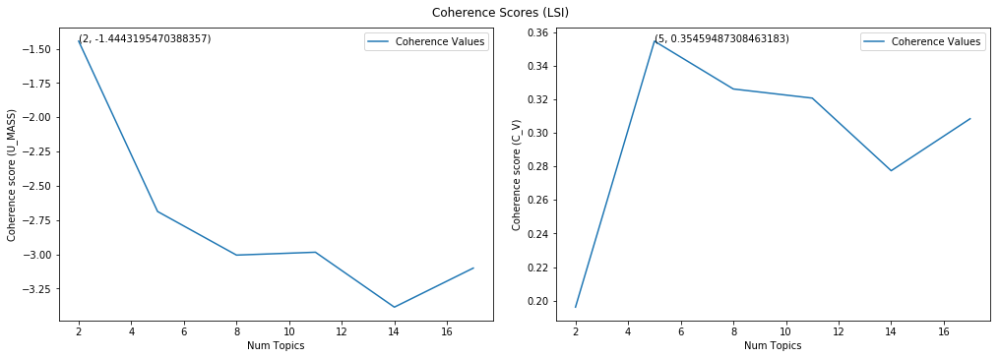

The most coherent number of LSI topics using the U_MASS measure is: 2
The most coherent number of LSI topics using the C_V measure is: 5


The most coherent number of LSI topics to use is: 5


In [82]:
best_num_lsi_topics = show_best_num_topics('LSI', coh_list_lsi_umass, coh_list_lsi_cv, max_topics=20, min_topics=2, stride=3)
print('The most coherent number of LSI topics to use is: {}'.format(best_num_lsi_topics))

In [83]:
lsi = models.LsiModel(corpus, id2word=dictionary, num_topics=best_num_lsi_topics, chunksize=1000)

In [116]:
#lsi_topics_matrix = lsi.show_topics(formatted=True, num_words=20)

In [117]:
#lsi_topics_matrix = np.array(lsi_topics_matrix)

#lsi_topics_matrix.shape

In [118]:
#lsi_topic_words = lsi_topics_matrix[:,1]
#for i in lsi_topic_words:
#    print([reg_ex.sub('', w) for w in i.split() if len(reg_ex.sub('', w)) > 0])
#    print('\n')

In [84]:
lsi_df = get_topics(lsi, best_num_lsi_topics)
#print(lsi_df)
lsi_df

,Topic # 01,Topic # 02,Topic # 03,Topic # 04,Topic # 05
0,story,sarah,people,water,story
1,time,juno,battle,ring,original
2,character,friend,story,dark,room
3,people,cave,world,original,work
4,think,subconscious,royale,yoshimi,beast
5,feel,action,school,watch,vampire
6,watch,deep,youth,scene,ghost
7,scene,leave,high,work,1408
8,end,stab,island,feel,battle
9,dont,conscious,kill,world,watch


In [85]:
lsi_hellinger_topic_distances = get_most_similar_topics(lsi, lsi_df, lsi_flag=True, num_topics=best_num_lsi_topics)
pretty_print(lsi_hellinger_topic_distances)

Hellinger Distances between topics are: 

______________________________________________________________________


(0.5568771924831382, 'Topic # 01', 'Topic # 05')
 (0.5564700053205395, 'Topic # 01', 'Topic # 04')
 (0.5561245367232094, 'Topic # 01', 'Topic # 03')
 (0.5557440151483, 'Topic # 01', 'Topic # 02')
 (0.02155843423777627, 'Topic # 03', 'Topic # 05')
 (0.021381967767978346, 'Topic # 04', 'Topic # 05')
 (0.01904421110593379, 'Topic # 02', 'Topic # 05')
 (0.01822447869120819, 'Topic # 03', 'Topic # 04')
 (0.01618622518404863, 'Topic # 02', 'Topic # 04')
 (0.015231272000547094, 'Topic # 02', 'Topic # 03')

______________________________________________________________________


In [86]:
lsi_dom_topics_df, lsi_dom_topics_final = get_dominant_topics(lsi, corpus, all_reviews_joined, lsi_flag=True)

In [87]:
#lsi_dom_topics_final.style.applymap(color_green).applymap(make_bold)
lsi_dom_topics_final_first30 = lsi_dom_topics_final.head(30)

print('Note: For the LSI model, the (un-normalized) topic-probability with the largest magnitude is shown! \n')
lsi_dom_topics_final_first30.style.applymap(color_green).applymap(make_bold)

Note: For the LSI model, the (un-normalized) topic-probability with the largest magnitude is shown! 



,Dominant_Topic,Probability_Contribution,Topic_Keywords,Original_Text
Document_Number,,,,
0,0,4.5363,"story, time, character, people, think, feel, watch, scene, end, dont, work, plot, look, want, doesnt, play, love, director, start, genre",coherent plot tell non-straightforward fashion open interpretations leave require audience fill-in open end possibly filling-in require viewings considerable think sense watch wailing time impression kind watch ponder read watch attempt people interpret explain different conclusion coherent underlie plot matt shift piece puzzle attempt recreate coherent narrative piece fit incompetence underlie story possibly intentionally possibly fundamentally inconsistent optical illusion escher drawing appear describe physical object fact dont physical sense accordingly enjoy boil content technically well-made cinematography acting costumes plot sense tell deceptive lure think plot sense matt sufficient thought leave lingering irritate feel dissatisfaction confusion maybe precisely point tell story purpose instill audience feel confusion face sequence event sense life times
1,0,2.004,"story, time, character, people, think, feel, watch, scene, end, dont, work, plot, look, want, doesnt, play, love, director, start, genre",spoiler review extraordinary hour technically-perfect humanistic fine writer directors business hauteur saw devil cipher close analog suggest david lynches 2001 mulholland drive technically perfect humanistic suspense opus captivate length walk theatre shake head wonder saw film-makers understand secret story tell present story viewer feel share experience protagonist tell story viewer going provide explanation wailing means re-quote writer director numerous interview enigmatically begin wonder nature god -- recommended levels entertainment puzzled clinic engage wont let
2,0,9.9919,"story, time, character, people, think, feel, watch, scene, end, dont, work, plot, look, want, doesnt, play, love, director, start, genre",wailing open quote bible easy forget fact watch certain point clear purpose quote served warning religious person scare wailing work religious parables overcome lengthy run time tonal imbalanced deliver funny truly terrify mysterious strange small village south korean village plague sickness police think wild mushroom blame police officer jong-goo think stranger meet woman information mysterious man slowly begin fall rabbit hole consume life daughter start sign sickness personal figure trust avoid director hong-jin nap struggle tonal balance time pitch perfect time place tone struggle stay consistent primarily funny brief burst depravity violence comedy work laugh numb times horrific imagery sudden effective balance lose act comedy slapstick fit rest character over-the-top act exaggerate different introduced middle section moment unintentional humor example man strike lighten caller id shaman phone shaman fortunately balance act smartly switch act intense terrify moment comedy offset terrify act start unfold audience gain new appreciation rest start reinterpret certain scenes problem scene sense ended feel natural fit story progressed require end sense hour minutes middle portion resolved shaman screen time perform ritual end important zombie scene feel awkward didnt fit rest want zombie grow popularity scene bring numb random character serve purpose rest despite scene previously mention overacting act generally speak fantastic father task solve happen daughter convey terror hatred build intense persona carry priest train advice father equally effective bring concern innocent quality terror ultimately happen young daughter sick shines channeling inner linda blair emphatically deliver horrible dirty line child performance truly terrify watch hatred eye slowly end religious overtone clearer locusts attack individual white black suggest characters true nature scene truly shines slowly unveil real nature certain characters minute change perspective things minute switch determine

In [88]:
lsi_most_representative_docs = get_most_representative_docs(lsi_dom_topics_final, n_topics=20, lsi_flag=True)
lsi_most_representative_docs.style.applymap(color_green).applymap(make_bold)

In [89]:
lsi_topic_dist = get_topic_distribution(lsi_dom_topics_final, lsi_most_representative_docs, n_topics=20)
lsi_topic_dist.style.applymap(color_green).applymap(make_bold)

,Documents_per_Topic,Percent_of_Total_Corpus,Topic_Keywords
Topic_Number,,,
0,988,0.988,"story, time, character, people, think, feel, watch, scene, end, dont, work, plot, look, want, doesnt, play, love, director, start, genre"
1,4,0.004,"sarah, juno, friend, cave, subconscious, action, deep, leave, stab, conscious, level, people, kill, event, dreamer, wreck, husband, story, run, death"
2,4,0.004,"people, battle, story, world, royale, school, youth, high, island, kill, idea, juno, sarah, videogame, hate, love, young, teenagers, die, problem"
3,2,0.002,"water, ring, dark, original, yoshimi, watch, scene, work, feel, world, girl, ikuko, think, time, beast, child, nakada, young, form, people"
4,2,0.002,"story, original, room, work, beast, vampire, ghost, 1408, battle, watch, french, school, character, scene, remake, le, creature, frontal, mike, genre"


In [90]:
#token pattern prevents default splitting of hyphenated words
vectorizer = CountVectorizer(token_pattern='(?u)\\b[\\w-]+\\b', analyzer='word', max_features=5000)
x_counts = vectorizer.fit_transform(all_reviews_joined)

transformer = TfidfTransformer(smooth_idf=False)
x_tfidf = transformer.fit_transform(x_counts)

In [91]:
lsi_svd_2D = TruncatedSVD(n_components=2, algorithm='randomized', n_iter=500, random_state=222)
lsi_2D = lsi_svd_2D.fit_transform(x_tfidf.T)

In [92]:
svd_2D_scatter(lsi_2D, color_scale_dimension=1)

In [93]:
lsi_svd_3D = TruncatedSVD(n_components=3, algorithm='randomized', n_iter=500, random_state=222)
lsi_3D = lsi_svd_3D.fit_transform(x_tfidf.T)

In [94]:
svd_3D_scatter(lsi_3D, color_scale_dimension=0)

# NMF (Non-Negative Matrix Factorization)

## Cf. https://papers.nips.cc/paper/1861-algorithms-for-non-negative-matrix-factorization.pdf

In [95]:
#token pattern prevents default splitting of hyphenated words
vectorizer = CountVectorizer(token_pattern='(?u)\\b[\\w-]+\\b', analyzer='word', max_features=5000)
x_counts = vectorizer.fit_transform(all_reviews_joined)

transformer = TfidfTransformer(smooth_idf=False)
x_tfidf = transformer.fit_transform(x_counts)

xtfidf_norm = normalize(x_tfidf, norm='l1', axis=1)

In [96]:
mod_list_nmf_umass, coh_list_nmf_umass = compute_coherence_values(NMF, dictionary, all_reviews_text, max_topics=20, 
                                                                  transformed_vectorizer=vectorizer, tfidf_norm=xtfidf_norm,
                                                                  min_topics=2, stride=3, n_top_words=20, measure='u_mass', 
                                                                  nmf_flag=True)

mod_list_nmf_cv, coh_list_nmf_cv = compute_coherence_values(NMF, dictionary, all_reviews_text, max_topics=20, 
                                                                  transformed_vectorizer=vectorizer, tfidf_norm=xtfidf_norm,
                                                                  min_topics=2, stride=3, n_top_words=20, measure='c_v', 
                                                                  nmf_flag=True)

Coherence of model with 2 topics has been computed
Coherence of model with 5 topics has been computed
Coherence of model with 8 topics has been computed
Coherence of model with 11 topics has been computed
Coherence of model with 14 topics has been computed
Coherence of model with 17 topics has been computed
All coherence values have been computed for the <class 'sklearn.decomposition.nmf.NMF'> using the U_MASS measure


Coherence of model with 2 topics has been computed
Coherence of model with 5 topics has been computed
Coherence of model with 8 topics has been computed
Coherence of model with 11 topics has been computed
Coherence of model with 14 topics has been computed
Coherence of model with 17 topics has been computed
All coherence values have been computed for the <class 'sklearn.decomposition.nmf.NMF'> using the C_V measure




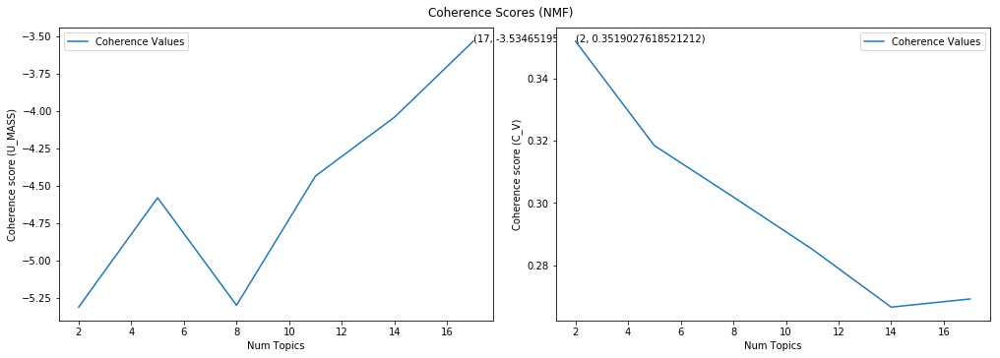

The most coherent number of NMF topics using the U_MASS measure is: 17
The most coherent number of NMF topics using the C_V measure is: 2


The most coherent number of NMF topics to use is: 2


In [97]:
best_num_nmf_topics = show_best_num_topics('NMF', coh_list_nmf_umass, coh_list_nmf_cv, max_topics=20, min_topics=2, stride=3)
print('The most coherent number of NMF topics to use is: {}'.format(best_num_nmf_topics))

In [98]:
nmf = NMF(n_components=best_num_nmf_topics, init='nndsvd', random_state=222)

nmf.fit(xtfidf_norm)

NMF(alpha=0.0, beta_loss='frobenius', init='nndsvd', l1_ratio=0.0,
  max_iter=200, n_components=2, random_state=222, shuffle=False,
  solver='cd', tol=0.0001, verbose=0)

In [99]:
nmf_df = get_nmf_topics(nmf, best_num_nmf_topics, 20)
nmf_df

,Topic # 01,Topic # 02
0,watch,summary
1,story,describe
2,dont,funny
3,time,scary
4,feel,plot
5,people,story
6,think,phobia
7,end,salvage
8,character,backpackers
9,original,ward


In [100]:
nmf_hellinger_topic_distances = get_most_similar_topics(nmf, nmf_flag=True, columns=nmf_df.columns)
pretty_print(nmf_hellinger_topic_distances)

Hellinger Distances between topics are: 

______________________________________________________________________


(0.8287134542069157, 'Topic # 01', 'Topic # 02')

______________________________________________________________________


### NMF: Second Pass with U_Mass Coherence optimized number of components

In [101]:
nmf_2 = NMF(n_components=17, init='nndsvd', random_state=222)

nmf_2.fit(xtfidf_norm)

NMF(alpha=0.0, beta_loss='frobenius', init='nndsvd', l1_ratio=0.0,
  max_iter=200, n_components=17, random_state=222, shuffle=False,
  solver='cd', tol=0.0001, verbose=0)

In [102]:
nmf_df_2 = get_nmf_topics(nmf_2, 17, 20)
nmf_df_2

,Topic # 01,Topic # 02,Topic # 03,Topic # 04,Topic # 05,Topic # 06,Topic # 07,Topic # 08,Topic # 09,Topic # 10,Topic # 11,Topic # 12,Topic # 13,Topic # 14,Topic # 15,Topic # 16,Topic # 17
0,feel,summary,gods,zombies,vs,insidious,ghost,phobia,ism,pirate,james,ring,hill,evil,conjuring,wrong,fun
1,character,describe,gift,morality,man,whats,sci-fi,segment,think,poses,watch,ju-on,silent,remake,wow,downhill,jar
2,story,funny,peter,mandatory,empathy,scary,background,funny,ive,waste,split,scary,game,pure,scare,answered,entry
3,time,scary,plenty,long-haired,foreign,aftermath,people,kinda,review,significance,dont,owe,look,need,jump,don,hollywood
4,scene,plot,debut,played,humanity,magically,complicate,backpackers,eden,disease,personalities,exorcista,think,yearn,cinema,boring,sundance
5,end,story,zombie,beautiful,train,grab,depend,salvage,thrillers,trust,mcavoy,agree,mystery,vampire,sequel,rating,park
6,real,recommend,end,train,eyes,intense,creativity,ward,watch,wood,different,reviews,isnt,poetic,conjure,t,seriously
7,people,life,story,woman,remember,scared,special,suspense,worth,bunch,saw,powerful,drama,thought-provoking,ive,m,style
8,genre,korean,infect,means,treat,risk,magnificent,gory,read,truth,award,water,doom,profound,incredible,list,redundant
9,director,interesting,suspenseful,girl,eye,door,relate,bias,ill,answer,wait,uncomfortable,visuals,gems,boredom,hole,inferior


In [103]:
nmf_hellinger_topic_distances_2 = get_most_similar_topics(nmf_2, nmf_flag=True, columns=nmf_df_2.columns)
pretty_print(nmf_hellinger_topic_distances_2)

Hellinger Distances between topics are: 

______________________________________________________________________


(0.9584644507879246, 'Topic # 03', 'Topic # 06')
 (0.9424645212814688, 'Topic # 03', 'Topic # 15')
 (0.9399235670404483, 'Topic # 02', 'Topic # 05')
 (0.9346295431141141, 'Topic # 03', 'Topic # 05')
 (0.9344291361702227, 'Topic # 03', 'Topic # 13')
 (0.9322648514116035, 'Topic # 04', 'Topic # 06')
 (0.9315124306651026, 'Topic # 02', 'Topic # 04')
 (0.9301052202804005, 'Topic # 03', 'Topic # 16')
 (0.9294710886755139, 'Topic # 08', 'Topic # 10')
 (0.9291101049170272, 'Topic # 03', 'Topic # 07')
 (0.9291003746279596, 'Topic # 05', 'Topic # 10')
 (0.9289175001415316, 'Topic # 04', 'Topic # 16')
 (0.9282824812843677, 'Topic # 04', 'Topic # 13')
 (0.9281640990078213, 'Topic # 04', 'Topic # 10')
 (0.9258252741428218, 'Topic # 06', 'Topic # 17')
 (0.9251840639484765, 'Topic # 03', 'Topic # 14')
 (0.924785695848468, 'Topic # 06', 'Topic # 08')
 (0.9209535866682126, 'Topic # 03', '

In [104]:
svd = TruncatedSVD(n_components=2)
documents_2d = svd.fit_transform(x_tfidf)
 
df = pd.DataFrame(columns=['x', 'y', 'document'])
df['x'], df['y'], df['document'] = documents_2d[:,0], documents_2d[:,1], range(len(all_reviews_text))
 
source = ColumnDataSource(ColumnDataSource.from_df(df))

#alternative syntax
#source = ColumnDataSource({'x': np.array([documents_2d[:,0]]), 'y': np.array([documents_2d[:,1]]), 'document': np.array([range(len(all_reviews_text))])})

labels = LabelSet(x="x", y="y", text="document", y_offset=8,
                  text_font_size="8pt", text_color="#555555",
                  source=source, text_align='center')
 
plot = figure(plot_width=1200, plot_height=1000)
plot.circle("x", "y", size=12, source=source, line_color="black", fill_alpha=0.8)
plot.add_layout(labels)

#Cf. JSON Serialization issue: 
#    https://github.com/bokeh/bokeh/issues/5439
#    https://github.com/bokeh/bokeh/issues/6222
#   https://github.com/bokeh/bokeh/issues/7523
try:
    show(plot, notebook_handle=True)
except Exception as e:
    print('Note!: {}'.format(e.__doc__))
    print(e)

In [105]:
svd = TruncatedSVD(n_components=2)
words_2d = svd.fit_transform(x_tfidf.T)
 
df = pd.DataFrame(columns=['x', 'y', 'word'])
df['x'], df['y'], df['word'] = words_2d[:,0], words_2d[:,1], vectorizer.get_feature_names()
 
source = ColumnDataSource(ColumnDataSource.from_df(df))
labels = LabelSet(x="x", y="y", text="word", y_offset=8,
                  text_font_size="8pt", text_color="#555555",
                  source=source, text_align='center')
 
plot = figure(plot_width=1200, plot_height=1000)
plot.circle("x", "y", size=8, source=source, line_color="black", fill_alpha=0.8)
plot.add_layout(labels)

#Cf. JSON Serialization issue: 
#    https://github.com/bokeh/bokeh/issues/5439
#    https://github.com/bokeh/bokeh/issues/6222
#   https://github.com/bokeh/bokeh/issues/7523
try:
    show(plot, notebook_handle=True)
except Exception as e:
    print('Note!: {}'.format(e.__doc__))
    print(e)

# LDA Visualization: T-distributed Stochastic Neighbor Embedding with PCA initialization

## Cf. http://www.jmlr.org/papers/volume9/vandermaaten08a/vandermaaten08a.pdf

In [106]:
lda_base_model = lda.LDA(n_topics=10, n_iter=1000, random_state=111)

In [109]:
doc_x_tops = lda_base_model.fit_transform(x_counts)

In [110]:
#doc_x_tops.shape

In [111]:
#setting threshold above which documents allocated to topics are 'confidently' displayed

#threshold = 0.5

#idx of doc above threshold
#_idx = np.amax(doc_x_tops, axis=1) > threshold

#doc_x_tops = doc_x_tops[_idx]

In [112]:
# angle close to 1 prioritizes speed over accuracy
tsne_model = TSNE(n_components=2, verbose=1, random_state=222, angle=.1, init='pca')

# 10D -> 2D
tsne_lda = tsne_model.fit_transform(doc_x_tops)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.001s...
[t-SNE] Computed neighbors for 1000 samples in 0.037s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 0.150693
[t-SNE] KL divergence after 250 iterations with early exaggeration: 69.865005
[t-SNE] Error after 1000 iterations: 0.866557


In [113]:
#20 colors
colormap = np.array([
    "#1f77b4", "#aec7e8", "#ff7f0e", "#ffbb78", "#2ca02c",
    "#98df8a", "#d62728", "#ff9896", "#9467bd", "#c5b0d5",
    "#8c564b", "#c49c94", "#e377c2", "#f7b6d2", "#7f7f7f",
    "#c7c7c7", "#bcbd22", "#dbdb8d", "#17becf", "#9edae5"
])

#number of displayed keywords
n_top_words = 10

In [114]:
#Cf. JSON Serialization issue: 
#    https://github.com/bokeh/bokeh/issues/5439
#    https://github.com/bokeh/bokeh/issues/6222
#   https://github.com/bokeh/bokeh/issues/7523
plot_tsne(all_reviews_joined, lda_base_model, vectorizer, doc_x_tops, tsne_lda, colormap, n_top_words=10)